In [1]:
import pandas as pd
import numpy as np
%matplotlib inline
from pathlib import Path
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf

### Canada Weather Data Using Openmeteo API

In [2]:
! pip install openmeteo-requests
! pip install requests-cache retry-requests numpy pandas

In [3]:
import openmeteo_requests

import requests_cache
import pandas as pd
from retry_requests import retry

# Setup the Open-Meteo API client with cache and retry on error
cache_session = requests_cache.CachedSession('.cache', expire_after = -1)
retry_session = retry(cache_session, retries = 5, backoff_factor = 0.2)
openmeteo = openmeteo_requests.Client(session = retry_session)

In [4]:
url = "https://archive-api.open-meteo.com/v1/archive"
params = {
    "latitude": [51.1762, 51.0501, 53.0168, 53.5501, 56.7268, 55.1667, 43.2501, 43.4254, 49.7, 42.9834, 50.0393, 45.5088, 45.4112, 46.8123, 52.2668, 43.7001, 49.2497, 49.8844],
    "longitude": [-115.5698, -114.0853, -112.8353, -113.4687, -111.381, -118.8027, -79.8496, -80.5112, -112.8186, -81.233, -110.6766, -73.5878, -75.6981, -71.2145, -113.802, -79.4163, -123.1193, -97.147],
    "start_date": "2018-01-01",
    "end_date": "2023-12-31",
    "daily": ["temperature_2m_max", "temperature_2m_min", "temperature_2m_mean", "apparent_temperature_max", "apparent_temperature_min", "apparent_temperature_mean", "daylight_duration", "sunshine_duration", "precipitation_sum", "rain_sum", "snowfall_sum", "precipitation_hours", "wind_speed_10m_max", "wind_gusts_10m_max", "wind_direction_10m_dominant", "shortwave_radiation_sum", "et0_fao_evapotranspiration"],
    "timezone": "auto"
}
responses = openmeteo.weather_api(url, params=params)

# Process first location. Add a for-loop for multiple locations or weather models
#response = responses[1]
all_cities_data = []

for city_index, response in enumerate(responses):

    daily = response.Daily()
    
    # Extracting daily data
    daily_temperature_2m_max = daily.Variables(0).ValuesAsNumpy()
    daily_temperature_2m_min = daily.Variables(1).ValuesAsNumpy()
    daily_temperature_2m_mean = daily.Variables(2).ValuesAsNumpy()
    daily_apparent_temperature_max = daily.Variables(3).ValuesAsNumpy()
    daily_apparent_temperature_min = daily.Variables(4).ValuesAsNumpy()
    daily_apparent_temperature_mean = daily.Variables(5).ValuesAsNumpy()
    daily_daylight_duration = daily.Variables(6).ValuesAsNumpy()
    daily_sunshine_duration = daily.Variables(7).ValuesAsNumpy()
    daily_precipitation_sum = daily.Variables(8).ValuesAsNumpy()
    daily_rain_sum = daily.Variables(9).ValuesAsNumpy()
    daily_snowfall_sum = daily.Variables(10).ValuesAsNumpy()
    daily_precipitation_hours = daily.Variables(11).ValuesAsNumpy()
    daily_wind_speed_10m_max = daily.Variables(12).ValuesAsNumpy()
    daily_wind_gusts_10m_max = daily.Variables(13).ValuesAsNumpy()
    daily_wind_direction_10m_dominant = daily.Variables(14).ValuesAsNumpy()
    daily_shortwave_radiation_sum = daily.Variables(15).ValuesAsNumpy()
    daily_et0_fao_evapotranspiration = daily.Variables(16).ValuesAsNumpy()
    
    # Getting the length of data (all arrays are of the same length and correspond to the same dates)
    num_days = len(daily_temperature_2m_max)
    
    for day_index in range(num_days):
        # Construct a record for each day
        day_data = {
            "city_index": city_index,
            "day_index": day_index,
            "temperature_2m_max": daily_temperature_2m_max[day_index],
            "temperature_2m_min": daily_temperature_2m_min[day_index],
            "temperature_2m_mean": daily_temperature_2m_mean[day_index],
            "apparent_temperature_max": daily_apparent_temperature_max[day_index],
            "apparent_temperature_min": daily_apparent_temperature_min[day_index],
            "apparent_temperature_mean": daily_apparent_temperature_mean[day_index],
            "daylight_duration": daily_daylight_duration[day_index],
            "sunshine_duration": daily_sunshine_duration[day_index],
            "precipitation_sum": daily_precipitation_sum[day_index],
            "rain_sum": daily_rain_sum[day_index],
            "snowfall_sum": daily_snowfall_sum[day_index],
            "precipitation_hours": daily_precipitation_hours[day_index],
            "wind_speed_10m_max": daily_wind_speed_10m_max[day_index],
            "wind_gust_10m_max": daily_wind_gusts_10m_max[day_index],
            "wind_direction_10m_dominant": daily_wind_direction_10m_dominant[day_index],
            "shortwave_radiation_sum": daily_shortwave_radiation_sum[day_index],
            "et0_fao_evapotransporation": daily_et0_fao_evapotranspiration[day_index]
        }
        
        # Append the day's data to the list
        all_cities_data.append(day_data)

# Convert the flattened list of dictionaries to a DataFrame
ca_weather_df = pd.DataFrame(all_cities_data)
    
#print(f"Coordinates {response.Latitude()}°N {response.Longitude()}°E")
#print(f"Elevation {response.Elevation()} m asl")
#print(f"Timezone {response.Timezone()} {response.TimezoneAbbreviation()}")
#print(f"Timezone difference to GMT+0 {response.UtcOffsetSeconds()} s")

In [5]:
# List of city names ordered by their corresponding index
city_names = [
    "Banff", "Calgary", "Camrose", "Edmonton", "Fort_McMurray",
    "Grande_Prairie", "Hamilton", "Kitchener", "Lethbridge", "London",
    "Medicine_Hat", "Montreal", "Ottawa", "Quebec_City", "Red_Deer",
    "Toronto", "Vancouver", "Winnipeg"
]

# Replace each city_index with the corresponding city name from the 'city_names' list
ca_weather_df['city_name'] = ca_weather_df['city_index'].apply(lambda x: city_names[x])

# Drop the old column
ca_weather_df.drop('city_index', axis=1, inplace=True)


In [6]:
# Creating a date column
start_date = pd.to_datetime("2018-01-01")
end_date = pd.to_datetime("2023-12-31")
date_range = pd.date_range(start=start_date, end=end_date)
ca_weather_df['date'] = ca_weather_df['day_index'].apply(lambda x: date_range[x])

In [7]:
ca_weather_df.head()

,day_index,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,daylight_duration,sunshine_duration,precipitation_sum,rain_sum,snowfall_sum,precipitation_hours,wind_speed_10m_max,wind_gust_10m_max,wind_direction_10m_dominant,shortwave_radiation_sum,et0_fao_evapotransporation,city_name,date
0,0,-14.789001,-26.438999,-21.680666,-19.795292,-31.009094,-26.516375,28789.857422,23494.693359,0.0,0.0,0.0,0.0,8.404284,35.279999,249.044128,4.83,0.210992,Banff,2018-01-01
1,1,-5.789001,-20.889000,-14.270251,-10.238356,-25.815229,-18.924349,28860.214844,23642.523438,0.0,0.0,0.0,0.0,7.342588,31.680000,258.206573,4.63,0.322017,Banff,2018-01-02
2,2,-3.539000,-13.939000,-10.309834,-7.526500,-18.504433,-14.661083,28936.193359,23727.732422,0.0,0.0,0.0,0.0,6.849467,28.080000,265.937592,4.57,0.331529,Banff,2018-01-03
3,3,-3.389000,-13.289001,-9.414001,-7.568361,-17.662254,-13.745647,29018.126953,23830.783203,0.0,0.0,0.0,0.0,7.208994,26.639999,277.997406,4.22,0.317713,Banff,2018-01-04
4,4,-4.089000,-11.339000,-8.174417,-8.151402,-15.771317,-12.462997,29106.751953,20338.925781,0.0,0.0,0.0,0.0,8.350138,36.000000,271.351044,3.43,0.264606,Banff,2018-01-05


In [8]:
# Create a new copy and set 'date' column as index
ca_weather_copy = ca_weather_df.set_index('date')

In [9]:
# Drop the old column
ca_weather_copy.drop('day_index', axis=1, inplace=True)
ca_weather_copy.head()

,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,daylight_duration,sunshine_duration,precipitation_sum,rain_sum,snowfall_sum,precipitation_hours,wind_speed_10m_max,wind_gust_10m_max,wind_direction_10m_dominant,shortwave_radiation_sum,et0_fao_evapotransporation,city_name
date,,,,,,,,,,,,,,,,,,
2018-01-01,-14.789001,-26.438999,-21.680666,-19.795292,-31.009094,-26.516375,28789.857422,23494.693359,0.0,0.0,0.0,0.0,8.404284,35.279999,249.044128,4.83,0.210992,Banff
2018-01-02,-5.789001,-20.889000,-14.270251,-10.238356,-25.815229,-18.924349,28860.214844,23642.523438,0.0,0.0,0.0,0.0,7.342588,31.680000,258.206573,4.63,0.322017,Banff
2018-01-03,-3.539000,-13.939000,-10.309834,-7.526500,-18.504433,-14.661083,28936.193359,23727.732422,0.0,0.0,0.0,0.0,6.849467,28.080000,265.937592,4.57,0.331529,Banff
2018-01-04,-3.389000,-13.289001,-9.414001,-7.568361,-17.662254,-13.745647,29018.126953,23830.783203,0.0,0.0,0.0,0.0,7.208994,26.639999,277.997406,4.22,0.317713,Banff
2018-01-05,-4.089000,-11.339000,-8.174417,-8.151402,-15.771317,-12.462997,29106.751953,20338.925781,0.0,0.0,0.0,0.0,8.350138,36.000000,271.351044,3.43,0.264606,Banff


In [10]:
len(ca_weather_copy)

39438

In [11]:
ca_weather_copy.index.unique()

DatetimeIndex(['2018-01-01', '2018-01-02', '2018-01-03', '2018-01-04',
               '2018-01-05', '2018-01-06', '2018-01-07', '2018-01-08',
               '2018-01-09', '2018-01-10',
               ...
               '2023-12-22', '2023-12-23', '2023-12-24', '2023-12-25',
               '2023-12-26', '2023-12-27', '2023-12-28', '2023-12-29',
               '2023-12-30', '2023-12-31'],
              dtype='datetime64[ns]', name='date', length=2191, freq=None)

In [13]:
ca_weather_copy.isnull().sum()

temperature_2m_max             0
temperature_2m_min             0
temperature_2m_mean            0
apparent_temperature_max       0
apparent_temperature_min       0
apparent_temperature_mean      0
daylight_duration              0
sunshine_duration              0
precipitation_sum              0
rain_sum                       0
snowfall_sum                   0
precipitation_hours            0
wind_speed_10m_max             0
wind_gust_10m_max              0
wind_direction_10m_dominant    0
shortwave_radiation_sum        0
et0_fao_evapotransporation     0
city_name                      0
dtype: int64

In [14]:
ca_city = ca_weather_copy[ca_weather_copy['city_name'] == 'Calgary']

# Ensure the index is in datetime format for plotting
ca_city.index = pd.to_datetime(ca_city.index)

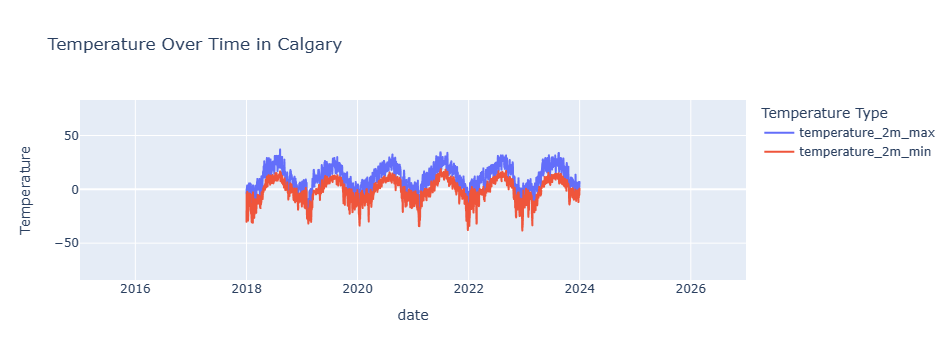

In [16]:
import plotly.express as px
fig_ca = px.line(ca_city, x=ca_city.index, y=['temperature_2m_max', 'temperature_2m_min'], title='Temperature Over Time in Calgary', labels={'value': 'Temperature', 'variable': 'Temperature Type'})
fig_ca.show()

In [17]:
# Create lagged temperature columns for 1-day, 3-day lags, and 7-day lags as "forecast"
ca_weather_copy['temp_min_1d_lag'] = ca_weather_copy['temperature_2m_min'].shift(1)
ca_weather_copy['temp_max_1d_lag'] = ca_weather_copy['temperature_2m_max'].shift(1)
ca_weather_copy['temp_mean_1d_lag'] = ca_weather_copy['temperature_2m_mean'].shift(1)

ca_weather_copy['temp_min_3d_lag'] = ca_weather_copy['temperature_2m_min'].shift(3)
ca_weather_copy['temp_max_3d_lag'] = ca_weather_copy['temperature_2m_max'].shift(3)
ca_weather_copy['temp_mean_3d_lag'] = ca_weather_copy['temperature_2m_mean'].shift(3)

ca_weather_copy['temp_min_7d_lag'] = ca_weather_copy['temperature_2m_min'].shift(7)
ca_weather_copy['temp_max_7d_lag'] = ca_weather_copy['temperature_2m_max'].shift(7)
ca_weather_copy['temp_mean_7d_lag'] = ca_weather_copy['temperature_2m_mean'].shift(7)

### Cleaning Alberta weather data

In [18]:
ab_weather_df = pd.read_csv("C:/Users/zhaoy/Documents/ECON_611_Uniper_Project/ECON-611-Uniper-Project/data_files/daily_data/CA_weather_data/alberta_weather.csv", encoding='ISO-8859-1')

In [19]:
ab_weather_df.head()

,Township,Date,Air Temp. Min. (°C),Air Temp. Max. (°C),Precip. (mm),Precip. Accumulated (mm),Relative Humidity Avg. (%),Modelled Snow Water Equiv. (mm),Incoming Solar Rad. Total (MJ/m2),Modelled Incoming Rad. Total (MJ/m2),Wind Speed 10 m Avg. (km/h)
0,T009R21W4,1/1/2017,-14.94,-4.96,1.30,1.30,89.79,11.12,3.13,3.99,16.73
1,T009R21W4,1/2/2017,-24.37,-13.47,0.27,1.57,85.18,11.42,3.48,4.20,4.36
2,T009R21W4,1/3/2017,-29.41,-17.53,0.26,1.83,80.17,11.71,4.48,4.41,8.67
3,T009R21W4,1/4/2017,-23.66,-10.17,0.27,2.10,81.87,12.01,3.84,4.74,12.36
4,T009R21W4,1/5/2017,-20.93,-4.17,0.26,2.36,74.93,12.29,3.49,5.33,13.27


In [20]:
# Convert 'date' column to datetime format
ab_weather_df['Date'] = pd.to_datetime(ab_weather_df['Date'])

# Filter the DataFrame to keep observations on or after January 1, 2018
ab_weather_copy = ab_weather_df[ab_weather_df['Date'] >= '2018-01-01']

In [21]:
ab_weather_copy.isnull().sum()

Township                                  0
Date                                      0
Air Temp. Min. (°C)                       0
Air Temp. Max. (°C)                       0
Precip. (mm)                              0
Precip. Accumulated (mm)                  0
Relative Humidity Avg. (%)                0
Modelled Snow Water Equiv. (mm)           0
Incoming Solar Rad. Total (MJ/m2)       486
Modelled Incoming Rad. Total (MJ/m2)      0
Wind Speed 10 m Avg. (km/h)               0
dtype: int64

In [22]:
ab_weather_copy['Incoming Solar Rad. Total (MJ/m2)'].unique()

array([6.12, 5.73, 5.66, ..., 0.67, 7.52, 1.38])

In [23]:
# Handling missing values using interpolation
ab_weather_copy['Incoming Solar Rad. Total (MJ/m2)'].interpolate(method='linear', inplace=True)

C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\pandas\core\generic.py:6915: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [24]:
ab_weather_copy.isnull().sum()

Township                                0
Date                                    0
Air Temp. Min. (°C)                     0
Air Temp. Max. (°C)                     0
Precip. (mm)                            0
Precip. Accumulated (mm)                0
Relative Humidity Avg. (%)              0
Modelled Snow Water Equiv. (mm)         0
Incoming Solar Rad. Total (MJ/m2)       0
Modelled Incoming Rad. Total (MJ/m2)    0
Wind Speed 10 m Avg. (km/h)             0
dtype: int64

In [25]:
ab_weather_copy = ab_weather_copy.set_index('Date')
ab_weather_copy.index = pd.to_datetime(ab_weather_copy.index)

In [26]:
# Change all letters to lower canse and add underscore in between words
ab_weather_copy.columns = ab_weather_copy.columns.str.lower()
ab_weather_copy.index.name = ab_weather_copy.index.name.lower()
ab_weather_copy.columns = ab_weather_copy.columns.str.replace(' ','_')

In [27]:
ab_weather_copy.head()

,township,air_temp._min._(°c),air_temp._max._(°c),precip._(mm),precip._accumulated_(mm),relative_humidity_avg._(%),modelled_snow_water_equiv._(mm),incoming_solar_rad._total_(mj/m2),modelled_incoming_rad._total_(mj/m2),wind_speed_10_m_avg._(km/h)
date,,,,,,,,,,
2018-01-01,T009R21W4,-36.27,-8.35,1.6,277.3,73.47,24.56,6.12,6.67,13.40
2018-01-02,T009R21W4,-11.67,0.57,1.0,278.3,70.58,25.73,5.73,4.45,15.22
2018-01-03,T009R21W4,-8.32,4.16,0.0,278.3,73.77,25.69,5.66,4.53,14.81
2018-01-04,T009R21W4,-11.21,1.60,0.0,278.3,79.07,25.65,5.97,4.62,12.68
2018-01-05,T009R21W4,-7.62,7.35,0.0,278.3,71.99,25.60,5.22,5.04,25.34


In [28]:
ab_city = ab_weather_copy[ab_weather_copy['township'] == 'T009R21W4']

# Ensure the index is in datetime format for plotting
ab_city.index = pd.to_datetime(ab_city.index)

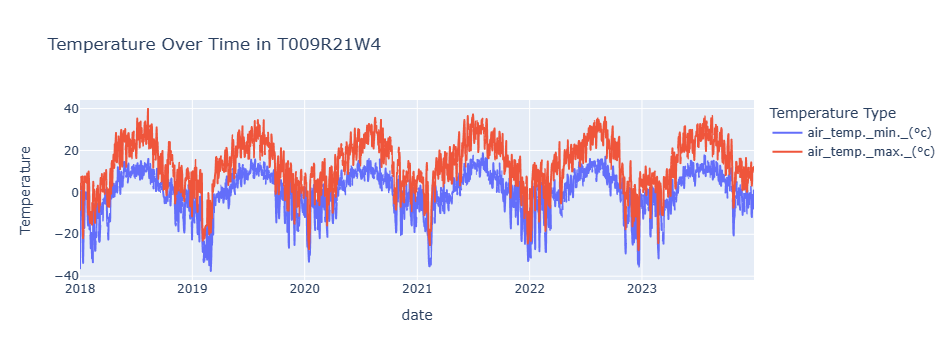

In [29]:
fig_ab = px.line(ab_city, x=ab_city.index, y=['air_temp._min._(°c)', 'air_temp._max._(°c)'], title='Temperature Over Time in T009R21W4', labels={'value': 'Temperature', 'variable': 'Temperature Type'})
fig_ab.show()

In [30]:
# Create lagged temperature columns for 1-day, 3-day lags, and 7-day lags as "forecast"
ab_weather_copy['temp_min_1d_lag'] = ab_weather_copy['air_temp._min._(°c)'].shift(1)
ab_weather_copy['temp_max_1d_lag'] = ab_weather_copy['air_temp._max._(°c)'].shift(1)

ab_weather_copy['temp_min_3d_lag'] = ab_weather_copy['air_temp._min._(°c)'].shift(3)
ab_weather_copy['temp_max_3d_lag'] = ab_weather_copy['air_temp._max._(°c)'].shift(3)

ab_weather_copy['temp_min_7d_lag'] = ab_weather_copy['air_temp._min._(°c)'].shift(7)
ab_weather_copy['temp_max_7d_lag'] = ab_weather_copy['air_temp._max._(°c)'].shift(7)

In [31]:
ab_weather_copy.head()

,township,air_temp._min._(°c),air_temp._max._(°c),precip._(mm),precip._accumulated_(mm),relative_humidity_avg._(%),modelled_snow_water_equiv._(mm),incoming_solar_rad._total_(mj/m2),modelled_incoming_rad._total_(mj/m2),wind_speed_10_m_avg._(km/h),temp_min_1d_lag,temp_max_1d_lag,temp_min_3d_lag,temp_max_3d_lag,temp_min_7d_lag,temp_max_7d_lag
date,,,,,,,,,,,,,,,,
2018-01-01,T009R21W4,-36.27,-8.35,1.6,277.3,73.47,24.56,6.12,6.67,13.40,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-02,T009R21W4,-11.67,0.57,1.0,278.3,70.58,25.73,5.73,4.45,15.22,-36.27,-8.35,NaN,NaN,NaN,NaN
2018-01-03,T009R21W4,-8.32,4.16,0.0,278.3,73.77,25.69,5.66,4.53,14.81,-11.67,0.57,NaN,NaN,NaN,NaN
2018-01-04,T009R21W4,-11.21,1.60,0.0,278.3,79.07,25.65,5.97,4.62,12.68,-8.32,4.16,-36.27,-8.35,NaN,NaN
2018-01-05,T009R21W4,-7.62,7.35,0.0,278.3,71.99,25.60,5.22,5.04,25.34,-11.21,1.60,-11.67,0.57,NaN,NaN


### Load Cleaned Daily Prices for Gas and Other Daily Variables

In [32]:
price_variables_df = pd.read_csv("C:/Users/zhaoy/Documents/ECON_611_Uniper_Project/ECON-611-Uniper-Project/data_files/daily_data/Daily_data(cleaned).csv")

In [33]:
price_variables_df.tail()

,date,henry_usd/mmbtu,aeco_5a_usd/mmbtu,aeco_5a_cad/gj,electricity_daily_average,electricity_daily_on_peak_average,electricity_daily_off_peak_average,electricity_30ravg_average,electricity_30ravg_on_peak_average,electricity_30ravg__off_peak_average,...,ngtl_storage_receipts_volume_(103m3),ngtl_gordondale_receipts_volume_(103m3),ngtl_groundbirch_east_receipts_volume_(103m3),ngtl_intra_provincial_deliveries_volume_(103m3),ngtl_border_deliveries_volume_(103m3),ngtl_empress_deliveries_volume_(103m3),ngtl_abc_deliveries_volume_(103m3),ngtl_mcneil_deliveries_volume_(103m3),ngtl_gordondale_deliveries_volume_(103m3),ngtl_storage_deliveries_volume_(103m3)
2155,2023-11-26,2.715,1.9322,2.5153,106.34,102.81,113.40,91.76,101.36,72.59,...,6569.5,3012.4,2479.4,198549.3,215404.6,125546.6,62565.1,17463.9,0.0,5722.7
2156,2023-11-27,2.715,1.8144,2.3449,49.04,44.40,58.32,91.54,101.35,71.95,...,8955.5,3018.1,3398.0,197237.6,212506.3,122333.4,62618.5,17666.2,0.0,4170.3
2157,2023-11-28,2.735,1.9060,2.4505,51.51,59.85,34.84,89.02,99.98,67.12,...,19439.8,3003.8,5087.8,191177.7,238539.0,128295.2,81195.4,19140.5,0.0,162.0
2158,2023-11-29,2.785,1.8903,2.4360,62.49,73.14,41.19,86.77,96.45,67.42,...,19277.6,3034.2,5073.7,201121.4,240537.1,128294.9,81570.7,19766.8,0.0,32.3
2159,2023-11-30,2.700,1.8949,2.4403,266.94,329.96,140.90,93.88,105.69,70.27,...,35370.5,3145.4,3116.1,205210.5,238307.9,126615.2,82263.7,18678.8,0.0,166.8


In [34]:
# Create a new copy and set 'date' column as index
price_variables_copy = price_variables_df.set_index('date')

In [35]:
# Convert indexes to datetime
price_variables_copy.index = pd.to_datetime(price_variables_copy.index)

In [37]:
# Filter the DataFrame to keep observations before Nov 30, 2023
ca_weather_copy = ca_weather_copy[ca_weather_copy.index <= '2023-11-30']
ab_weather_copy = ab_weather_copy[ab_weather_copy.index <= '2023-11-30']

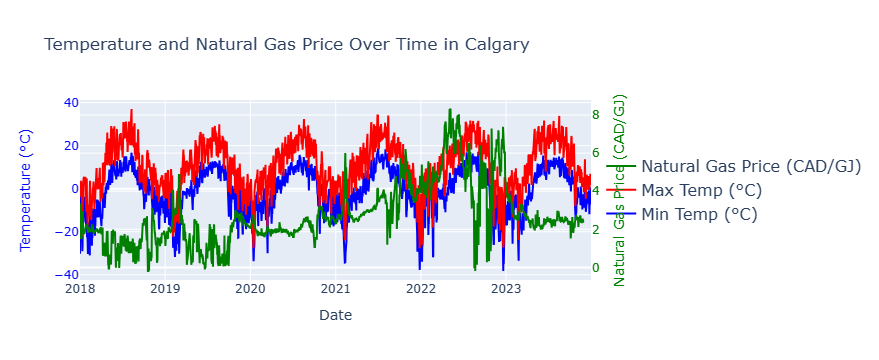

In [38]:
import plotly.graph_objects as go
# Create a Plotly figure
fig = go.Figure()

# Add temperature data
fig.add_trace(go.Scatter(x=ca_city.index, y=ca_city['temperature_2m_min'], name='Min Temp (°C)', mode='lines', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=ca_city.index, y=ca_city['temperature_2m_max'], name='Max Temp (°C)', mode='lines', line=dict(color='red')))

# Add natural gas price data using a secondary y-axis
fig.add_trace(go.Scatter(x=price_variables_copy.index, y=price_variables_copy['aeco_5a_cad/gj'], name='Natural Gas Price (CAD/GJ)', mode='lines', line=dict(color='green'), yaxis='y2'))

# Update layout with secondary y-axis
fig.update_layout(
    title='Temperature and Natural Gas Price Over Time in Calgary',
    xaxis_title='Date',
    yaxis_title='Temperature (°C)',
    yaxis=dict(
        title='Temperature (°C)',
        titlefont=dict(color='blue'),
        tickfont=dict(color='blue'),
    ),
    yaxis2=dict(
        title='Natural Gas Price (CAD/GJ)',
        titlefont=dict(color='green'),
        tickfont=dict(color='green'),
        overlaying='y',
        side='right'
    ),
    legend=dict(y=0.5, traceorder='reversed', font_size=16)
)

# Show the figure
fig.show()

In [39]:
from sklearn import linear_model
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler

## Across Canada

### Combining all CA city data with daily variables

In [40]:
# Creating cyclical features from day of the year
day_of_year = ca_weather_copy.index.dayofyear
ca_weather_copy['sin_day_of_year'] = np.sin(2 * np.pi * day_of_year / 365)
ca_weather_copy['cos_day_of_year'] = np.cos(2 * np.pi * day_of_year / 365)


In [41]:
# Combine the datasets on their date index
ca_combined_df = ca_weather_copy.join(price_variables_copy, how='left')
ca_combined_df.head()

,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,daylight_duration,sunshine_duration,precipitation_sum,rain_sum,...,ngtl_storage_receipts_volume_(103m3),ngtl_gordondale_receipts_volume_(103m3),ngtl_groundbirch_east_receipts_volume_(103m3),ngtl_intra_provincial_deliveries_volume_(103m3),ngtl_border_deliveries_volume_(103m3),ngtl_empress_deliveries_volume_(103m3),ngtl_abc_deliveries_volume_(103m3),ngtl_mcneil_deliveries_volume_(103m3),ngtl_gordondale_deliveries_volume_(103m3),ngtl_storage_deliveries_volume_(103m3)
date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,-14.789001,-26.438999,-21.680666,-19.795292,-31.009094,-26.516375,28789.857422,23494.693359,0.0,0.0,...,67055.7,4327.7,12802.6,189057.3,210629.0,96077.1,61914.5,47056.8,0.0,0.0
2018-01-01,-3.751000,-30.201000,-16.969751,-10.319794,-36.431252,-22.950150,28830.480469,23759.443359,0.0,0.0,...,67055.7,4327.7,12802.6,189057.3,210629.0,96077.1,61914.5,47056.8,0.0,0.0
2018-01-01,-6.139000,-29.539000,-20.355667,-12.209106,-34.811440,-26.140963,27629.332031,21396.341797,0.0,0.0,...,67055.7,4327.7,12802.6,189057.3,210629.0,96077.1,61914.5,47056.8,0.0,0.0
2018-01-01,-5.425500,-28.325499,-18.417170,-10.393333,-33.766930,-23.996672,27306.472656,19386.562500,0.0,0.0,...,67055.7,4327.7,12802.6,189057.3,210629.0,96077.1,61914.5,47056.8,0.0,0.0
2018-01-01,-7.713000,-23.913000,-17.394251,-13.038786,-30.080166,-23.063616,24959.728516,17042.283203,0.1,0.0,...,67055.7,4327.7,12802.6,189057.3,210629.0,96077.1,61914.5,47056.8,0.0,0.0


In [42]:
ca_combined_df.columns

Index(['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean',
       'apparent_temperature_max', 'apparent_temperature_min',
       'apparent_temperature_mean', 'daylight_duration', 'sunshine_duration',
       'precipitation_sum', 'rain_sum', 'snowfall_sum', 'precipitation_hours',
       'wind_speed_10m_max', 'wind_gust_10m_max',
       'wind_direction_10m_dominant', 'shortwave_radiation_sum',
       'et0_fao_evapotransporation', 'city_name', 'temp_min_1d_lag',
       'temp_max_1d_lag', 'temp_mean_1d_lag', 'temp_min_3d_lag',
       'temp_max_3d_lag', 'temp_mean_3d_lag', 'temp_min_7d_lag',
       'temp_max_7d_lag', 'temp_mean_7d_lag', 'sin_day_of_year',
       'cos_day_of_year', 'henry_usd/mmbtu', 'aeco_5a_usd/mmbtu',
       'aeco_5a_cad/gj', 'electricity_daily_average',
       'electricity_daily_on_peak_average',
       'electricity_daily_off_peak_average', 'electricity_30ravg_average',
       'electricity_30ravg_on_peak_average',
       'electricity_30ravg__off_peak_averag

In [43]:
# Add month and season columns to the dataset
ca_combined_df['month'] = ca_combined_df.index.month

# Define a function to map month to season
def month_to_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:  # 9, 10, 11
        return 'Autumn'


ca_combined_df['season'] = ca_combined_df['month'].apply(month_to_season)

# Assuming 'ca_combined_df' is your DataFrame
ca_combined_df = pd.get_dummies(ca_combined_df, columns=['month', 'season'])

ca_combined_df.head()


,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,daylight_duration,sunshine_duration,precipitation_sum,rain_sum,...,month_7,month_8,month_9,month_10,month_11,month_12,season_Autumn,season_Spring,season_Summer,season_Winter
date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,-14.789001,-26.438999,-21.680666,-19.795292,-31.009094,-26.516375,28789.857422,23494.693359,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1
2018-01-01,-3.751000,-30.201000,-16.969751,-10.319794,-36.431252,-22.950150,28830.480469,23759.443359,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1
2018-01-01,-6.139000,-29.539000,-20.355667,-12.209106,-34.811440,-26.140963,27629.332031,21396.341797,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1
2018-01-01,-5.425500,-28.325499,-18.417170,-10.393333,-33.766930,-23.996672,27306.472656,19386.562500,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1
2018-01-01,-7.713000,-23.913000,-17.394251,-13.038786,-30.080166,-23.063616,24959.728516,17042.283203,0.1,0.0,...,0,0,0,0,0,0,0,0,0,1


In [112]:
ca_weather_copy

,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,daylight_duration,sunshine_duration,precipitation_sum,rain_sum,...,temp_max_1d_lag,temp_mean_1d_lag,temp_min_3d_lag,temp_max_3d_lag,temp_mean_3d_lag,temp_min_7d_lag,temp_max_7d_lag,temp_mean_7d_lag,sin_day_of_year,cos_day_of_year
date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,-14.789001,-26.438999,-21.680666,-19.795292,-31.009094,-26.516375,28789.857422,23494.693359,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.017213,0.999852
2018-01-02,-5.789001,-20.889000,-14.270251,-10.238356,-25.815229,-18.924349,28860.214844,23642.523438,0.0,0.0,...,-14.789001,-21.680666,NaN,NaN,NaN,NaN,NaN,NaN,0.034422,0.999407
2018-01-03,-3.539000,-13.939000,-10.309834,-7.526500,-18.504433,-14.661083,28936.193359,23727.732422,0.0,0.0,...,-5.789001,-14.270251,NaN,NaN,NaN,NaN,NaN,NaN,0.051620,0.998667
2018-01-04,-3.389000,-13.289001,-9.414001,-7.568361,-17.662254,-13.745647,29018.126953,23830.783203,0.0,0.0,...,-3.539000,-10.309834,-26.438999,-14.789001,-21.680666,NaN,NaN,NaN,0.068802,0.997630
2018-01-05,-4.089000,-11.339000,-8.174417,-8.151402,-15.771317,-12.462997,29106.751953,20338.925781,0.0,0.0,...,-3.389000,-9.414001,-20.889000,-5.789001,-14.270251,NaN,NaN,NaN,0.085965,0.996298
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-26,-0.869500,-12.269500,-7.023668,-6.422213,-19.083889,-14.106110,30945.292969,13049.648438,1.6,0.0,...,0.730500,-2.986167,-12.119500,-8.169499,-9.529917,-1.7695,7.130500,1.622167,-0.566702,0.823923
2023-11-27,-9.469500,-14.269500,-11.782001,-14.813871,-19.099304,-17.228489,30810.693359,25235.888672,0.0,0.0,...,-0.869500,-7.023668,-10.569500,-1.569500,-6.357001,2.1305,9.980500,4.609667,-0.552435,0.833556
2023-11-28,3.180500,-13.419499,-4.009083,-2.094320,-19.161922,-9.742492,30680.632812,17796.375000,0.2,0.0,...,-9.469500,-11.782001,-6.119500,0.730500,-2.986167,-4.2695,1.530500,-2.329917,-0.538005,0.842942


### LR, Ridge, and Lasso for Predicting AECO Prices Using Weather Variables only

#### Linear Regression

In [55]:
# Selecting the weather variables as features (X) and 'aeco_5a_cad/gj' as the target variable (y)
features = ['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean','snowfall_sum','temp_min_1d_lag',
            'temp_max_1d_lag', 'temp_min_3d_lag', 'temp_max_3d_lag',
            'temp_min_7d_lag', 'temp_max_7d_lag','temp_mean_1d_lag', 'temp_mean_3d_lag',
            'temp_mean_7d_lag', 'sin_day_of_year',
            'cos_day_of_year']

target = 'aeco_5a_cad/gj'

# Filter the combined dataset for the relevant columns
model_df = ca_combined_df[features + [target]].dropna()

# Splitting the data based on date
train_data = model_df.loc['2018':'2022']
test_data = model_df.loc['2023']

X_train = train_data[features]
y_train = train_data[target]
X_test = test_data[features]
y_test = test_data[target]
#X_train, X_test, y_train, y_test = train_test_split(model_df[features], model_df[target], test_size=0.2, random_state=42)
# Standardizing the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initializing and fitting the Linear Regression model
linear_reg = LinearRegression()
linear_reg.fit(X_train_scaled, y_train)

# Predicting on the test set
y_pred = linear_reg.predict(X_test_scaled)

# Evaluating the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

mse, r2


(0.13766682476615447, 0.2147437963950476)

In [46]:
# Create a DataFrame from y_test for actual values
out_of_sample_results = pd.DataFrame(y_test)

# Rename the target variable column to 'Actual' for clarity
out_of_sample_results.rename(columns={'aeco_5a_cad/gj': 'Actual'}, inplace=True)

# Reset index to make 'date' a column again (if needed, depending on your DataFrame setup)
out_of_sample_results.reset_index(inplace=True)

# Add a column of "out-of-sample" predictions to that dataframe
out_of_sample_results['Out-of-Sample Predictions'] = y_pred

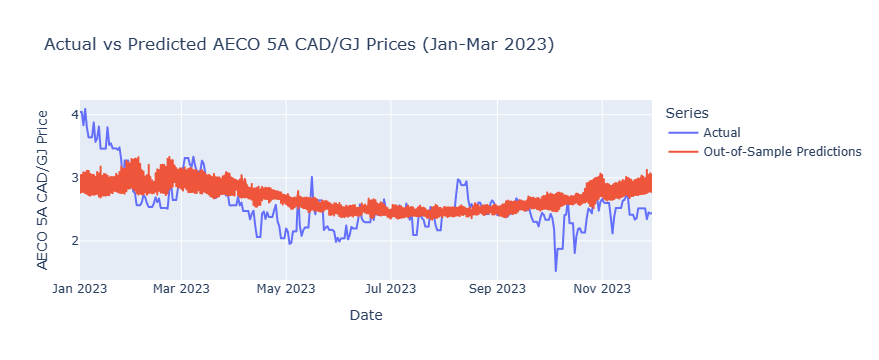

In [47]:
out_of_sample_results['date'] = pd.to_datetime(out_of_sample_results['date'])

focused_period = out_of_sample_results[(out_of_sample_results['date'] >= '2023-01-01') & 
                                       (out_of_sample_results['date'] <= '2023-11-30')]


# Convert index to a column if it's not already, as Plotly works best with column data
focused_period.reset_index(inplace=True)

# Using Plotly to plot the actual vs predicted prices
fig = px.line(focused_period, x='date', y=['Actual', 'Out-of-Sample Predictions'], 
              title='Actual vs Predicted AECO 5A CAD/GJ Prices (Jan-Mar 2023)', 
              labels={'value': 'AECO 5A CAD/GJ Price', 'variable': 'Series', 'date': 'Date'})

# Customize the appearance
fig.update_layout(xaxis_title='Date',
                  yaxis_title='AECO 5A CAD/GJ Price',
                  legend_title='Series')

# Show the plot
fig.show()

In [48]:
# Group by 'date' and calculate the mean for both 'Actual' and 'Out-of-Sample Predictions'
average_predictions = out_of_sample_results.groupby('date').mean().reset_index()

average_predictions


,date,Actual,Out-of-Sample Predictions
0,2023-01-01,4.0432,2.914207
1,2023-01-02,4.0432,2.909406
2,2023-01-03,3.8334,2.927178
3,2023-01-04,4.0904,2.929705
4,2023-01-05,3.7974,2.953683
...,...,...,...
329,2023-11-26,2.5153,2.861940
330,2023-11-27,2.3449,2.885891
331,2023-11-28,2.4505,2.875095
332,2023-11-29,2.4360,2.891636


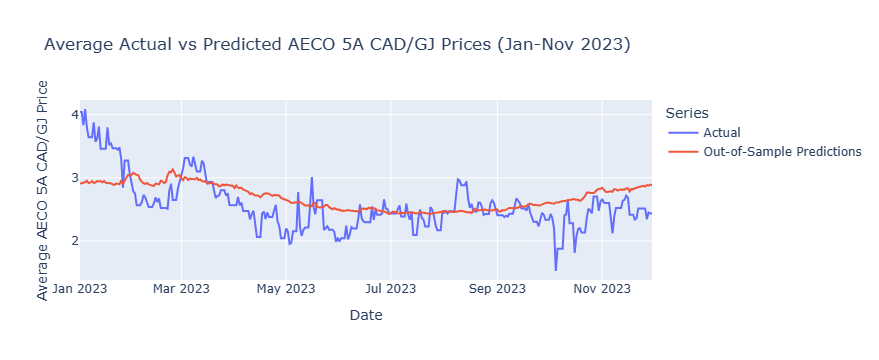

In [49]:
# Aggregate data by date, calculating the mean for 'Actual' and 'Out-of-Sample Predictions'
averaged_focused_period = focused_period.groupby('date').mean().reset_index()

fig = px.line(averaged_focused_period, x='date', y=['Actual', 'Out-of-Sample Predictions'], 
              title='Average Actual vs Predicted AECO 5A CAD/GJ Prices (Jan-Nov 2023)', 
              labels={'value': 'AECO 5A CAD/GJ Price', 'variable': 'Series', 'date': 'Date'})

# Customize the appearance
fig.update_layout(xaxis_title='Date',
                  yaxis_title='Average AECO 5A CAD/GJ Price',
                  legend_title='Series')

# Show the plot
fig.show()


In [50]:

averaged_focused_period['date'] = pd.to_datetime(averaged_focused_period['date'])

# Correctly filter the DataFrame for the desired date range
averaged_focused_period = averaged_focused_period[(averaged_focused_period['date'] >= '2023-06-01') & 
                                                  (averaged_focused_period['date'] <= '2023-08-30')]
averaged_focused_period


,date,index,Actual,Out-of-Sample Predictions
151,2023-06-01,2726.5,1.991600,2.496776
152,2023-06-02,2744.5,2.041633,2.479124
153,2023-06-03,2762.5,2.041633,2.481428
154,2023-06-04,2780.5,2.041633,2.473618
155,2023-06-05,2798.5,2.243900,2.484496
...,...,...,...,...
237,2023-08-26,4274.5,2.427400,2.486319
238,2023-08-27,4292.5,2.427400,2.483918
239,2023-08-28,4310.5,2.599800,2.483387
240,2023-08-29,4328.5,2.642500,2.482234


#### Ridge

In [56]:
from sklearn.linear_model import RidgeCV

# Defining the alphas to test for RidgeCV (Ridge Regression with built-in cross-validation)
alphas = np.logspace(-6, 6, 13)

# Initializing and fitting the RidgeCV model
ridge_cv = RidgeCV(alphas=alphas, store_cv_values=True)
ridge_cv.fit(X_train_scaled, y_train)

# Predicting on the test set
y_pred_ridge = ridge_cv.predict(X_test_scaled)

# Evaluating the Ridge Regression model
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
r2_ridge = r2_score(y_test, y_pred_ridge)

# Optimal alpha value
optimal_alpha = ridge_cv.alpha_

mse_ridge, r2_ridge, optimal_alpha


(0.13540181466260948, 0.22766349028686073, 10000.0)

#### Lasso

In [57]:
from sklearn.linear_model import LassoCV

# Initialize LassoCV with built-in cross-validation to find the optimal alpha
lasso_cv = LassoCV(cv=5, random_state=42, max_iter=10000, precompute=False)

# Fit LassoCV model on the training data
lasso_cv.fit(X_train, y_train)

# Optimal alpha value found by LassoCV
optimal_alpha_lasso = lasso_cv.alpha_

# Predicting on the test set with the fitted Lasso model
y_pred_lasso = lasso_cv.predict(X_test)

# Evaluating the Lasso Regression model
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
r2_lasso = r2_score(y_test, y_pred_lasso)

optimal_alpha_lasso, mse_lasso, r2_lasso

(0.44881180027607903, 0.1409596773681818, 0.19596125428520472)

In [58]:
# Extracting coefficients for Linear Regression, Ridge, and Lasso models
linear_reg_coeffs = linear_reg.coef_
ridge_coeffs = ridge_cv.coef_
lasso_coeffs = lasso_cv.coef_

# Creating a dataframe to compare the models' performance and coefficients
model_comparison_df = pd.DataFrame({
    'Model': ['Linear Regression', 'Ridge Regression', 'Lasso Regression'],
    'MSE': [mse, mse_ridge, mse_lasso],
    'R^2': [r2, r2_ridge, r2_lasso],
    'Coefficients': [linear_reg_coeffs, ridge_coeffs, lasso_coeffs]
})

model_comparison_df


,Model,MSE,R^2,Coefficients
0,Linear Regression,0.137667,0.214744,"[0.06030799266996058, 0.008086140556332647, -0..."
1,Ridge Regression,0.135402,0.227663,"[-0.02594640633609493, -0.029886266208959372, ..."
2,Lasso Regression,0.140960,0.195961,"[-0.0, -0.00017306808501983857, -0.01069402678..."


#### Rolling Window Prediction

In [95]:
# Check NaNs all at once
columns_to_check = features + [target]

# Drop NaN values
ca_combined_cleaned = ca_combined_df.dropna(subset=columns_to_check)

In [96]:
ca_combined_cleaned[target].isnull().sum()

0

In [97]:
ca_combined_cleaned[target]

date
2018-01-01    3.3518
2018-01-01    3.3518
2018-01-01    3.3518
2018-01-01    3.3518
2018-01-01    3.3518
               ...  
2023-11-30    2.4403
2023-11-30    2.4403
2023-11-30    2.4403
2023-11-30    2.4403
2023-11-30    2.4403
Name: aeco_5a_cad/gj, Length: 38873, dtype: float64

In [98]:
# Correct way to define features list
features = ['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean',
            'snowfall_sum', 'temp_min_1d_lag', 'temp_max_1d_lag', 'temp_min_3d_lag', 
            'temp_max_3d_lag', 'temp_min_7d_lag', 'temp_max_7d_lag', 'temp_mean_1d_lag', 
            'temp_mean_3d_lag', 'temp_mean_7d_lag', 'sin_day_of_year', 'cos_day_of_year']

# Correct way to define target
target = 'aeco_5a_cad/gj'


In [99]:
window_size = 30
predictions = []
alphas = np.logspace(-6, 6, 13)

for i in range(window_size, len(ca_combined_cleaned)):
    # Prepare training data
    X_train = ca_combined_cleaned.iloc[i-window_size:i][features]
    y_train = ca_combined_cleaned.iloc[i-window_size:i][target]
    
    # Scaling features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    
    # Prepare the next day's features for prediction
    X_test = ca_combined_cleaned.iloc[i:i+1][features]
    X_test_scaled = scaler.transform(X_test) 

    # Initialize and train RidgeCV
    ridge_model = RidgeCV(alphas=alphas, cv=5, scoring='neg_mean_squared_error')
    ridge_model.fit(X_train_scaled, y_train)
   
    # Predict
    prediction = ridge_model.predict(X_test_scaled)
    predictions.append(prediction[0])

# Store predictions
ca_combined_cleaned['predicted_' + target] = [np.nan] * window_size + predictions

C:\Users\zhaoy\AppData\Local\Temp\ipykernel_20328\472546811.py:27: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [100]:
optimal_alpha = ridge_model.alpha_
optimal_alpha

1e-06

In [101]:
neg_mse = ridge_model.best_score_
mse = -neg_mse
r_squared = ridge_model.score(X_train_scaled, y_train)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"R-squared: {r_squared}")

RMSE: 4.4418625880164197e-10
MSE: 1.9730143250819927e-19
R-squared: 0.9999999999999993


In [102]:
# Calculate the average predicted price for each date
average_predicted_prices = ca_combined_cleaned.groupby('date')['predicted_' + target].mean().reset_index(name='average_predicted_price')
average_predicted_prices

,date,average_predicted_price
0,2018-01-01,NaN
1,2018-01-02,2.075400
2,2018-01-03,1.711024
3,2018-01-04,1.818984
4,2018-01-05,1.579516
...,...,...
2155,2023-11-26,2.515300
2156,2023-11-27,2.359511
2157,2023-11-28,2.409834
2158,2023-11-29,2.442011


In [103]:
original_prices = ca_combined_cleaned[['aeco_5a_cad/gj']].reset_index().drop_duplicates()

# Merge 'average_predicted_prices' DataFrame on the 'date' column.
rolling_window_df = average_predicted_prices.merge(original_prices, on='date', how='left')
rolling_window_df.rename(columns={'aeco_5a_cad/gj': 'actual_aeco_price'}, inplace=True)

In [104]:
rolling_window_df.dropna(inplace=True)
rolling_window_df

,date,average_predicted_price,actual_aeco_price
1,2018-01-02,2.075400,2.0754
2,2018-01-03,1.711024,1.8480
3,2018-01-04,1.818984,1.8377
4,2018-01-05,1.579516,1.5431
5,2018-01-06,1.519400,1.5431
...,...,...,...
2155,2023-11-26,2.515300,2.5153
2156,2023-11-27,2.359511,2.3449
2157,2023-11-28,2.409834,2.4505
2158,2023-11-29,2.442011,2.4360


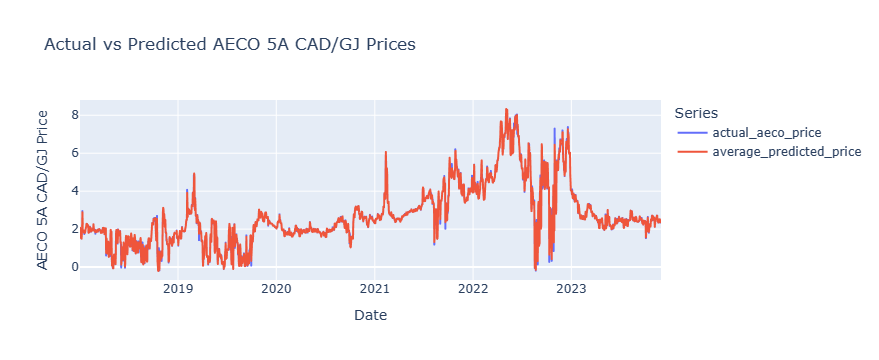

In [105]:
fig = px.line(rolling_window_df, x='date', y=['actual_aeco_price', 'average_predicted_price'], 
              title='Actual vs Predicted AECO 5A CAD/GJ Prices', 
              labels={'value': 'AECO 5A CAD/GJ Price', 'variable': 'Series', 'date': 'Date'})

# Customize the appearance
fig.update_layout(xaxis_title='Date',
                  yaxis_title='AECO 5A CAD/GJ Price',
                  legend_title='Series')

# Show the plot
fig.show()

In [106]:
# Averaging features across cities for each date
average_features_per_date = ca_combined_cleaned[features + [target]].groupby(ca_combined_cleaned.index).mean()

# Selecting the latest window with only the features used in the model
latest_window = average_features_per_date[features].iloc[-window_size:]

# Apply scaling with the scaler fitted on the exact same features during training
latest_window_scaled = scaler.transform(latest_window)

num_days_to_forecast = 1 
current_window_scaled = latest_window_scaled

predictions = [] 

for _ in range(num_days_to_forecast):
    # Predict the next day's price using the current window
    next_day_prediction = ridge_model.predict(current_window_scaled[-1].reshape(1, -1))
    new_features = np.roll(current_window_scaled, -1, axis=0)
    new_features[-1, -1] = next_day_prediction
    current_window_scaled = scaler.transform(new_features)  
    predictions.append(next_day_prediction[0])

print(predictions)

[2.440299999950766]


C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



### LR, Ridge, and Lasso for Predicting AECO Prices Using Natural Gas Flow Variables

In [59]:
# Convert the natural gas flow variables from 10^3 m^3 to GJ using the average heating value

# Natural gas flow variables to be converted
ng_flow_variables = [
    'measured_receipts_volume_(103m3)',
    'ngtl_storage_receipts_volume_(103m3)',
    'ngtl_gordondale_receipts_volume_(103m3)',
    'ngtl_groundbirch_east_receipts_volume_(103m3)',
    'ngtl_intra_provincial_deliveries_volume_(103m3)',
    'ngtl_empress_deliveries_volume_(103m3)',
    'ngtl_abc_deliveries_volume_(103m3)',
    'ngtl_mcneil_deliveries_volume_(103m3)',
    'ngtl_gordondale_deliveries_volume_(103m3)',
    'ngtl_storage_deliveries_volume_(103m3)'
]

# Conversion: Volume (10^3 m^3) * 40.05 (MJ/m^3) = Energy content in MJ
# 1 GJ = 1,000 MJ, so divide the result by 1,000 to convert to GJ
for variable in ng_flow_variables:
    new_col_name = f"{variable}_in_GJ"
    ca_combined_df[new_col_name] = ca_combined_df[variable] * 40.05 / 1.0  # Convert directly to GJ without dividing by 1,000 due to the original unit being 10^3 m^3

In [60]:
ca_combined_df['receipts_volume_lag1'] = ca_combined_df['measured_receipts_volume_(103m3)_in_GJ'].shift(1)

#### Linear Regression

In [61]:
ca_combined_df.columns

Index(['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean',
       'apparent_temperature_max', 'apparent_temperature_min',
       'apparent_temperature_mean', 'daylight_duration', 'sunshine_duration',
       'precipitation_sum', 'rain_sum', 'snowfall_sum', 'precipitation_hours',
       'wind_speed_10m_max', 'wind_gust_10m_max',
       'wind_direction_10m_dominant', 'shortwave_radiation_sum',
       'et0_fao_evapotransporation', 'city_name', 'temp_min_1d_lag',
       'temp_max_1d_lag', 'temp_mean_1d_lag', 'temp_min_3d_lag',
       'temp_max_3d_lag', 'temp_mean_3d_lag', 'temp_min_7d_lag',
       'temp_max_7d_lag', 'temp_mean_7d_lag', 'sin_day_of_year',
       'cos_day_of_year', 'henry_usd/mmbtu', 'aeco_5a_usd/mmbtu',
       'aeco_5a_cad/gj', 'electricity_daily_average',
       'electricity_daily_on_peak_average',
       'electricity_daily_off_peak_average', 'electricity_30ravg_average',
       'electricity_30ravg_on_peak_average',
       'electricity_30ravg__off_peak_averag

In [62]:
from sklearn.preprocessing import PolynomialFeatures

# Listing all converted natural gas flow variables in GJ
weather_ng_features = [
    'electricity_daily_average',
    'measured_receipts_volume_(103m3)_in_GJ',
    'ngtl_storage_receipts_volume_(103m3)_in_GJ',
    'ngtl_gordondale_receipts_volume_(103m3)_in_GJ',
    'ngtl_groundbirch_east_receipts_volume_(103m3)_in_GJ',
    'ngtl_intra_provincial_deliveries_volume_(103m3)_in_GJ',
    'ngtl_empress_deliveries_volume_(103m3)_in_GJ',
    'ngtl_abc_deliveries_volume_(103m3)_in_GJ',
    'ngtl_mcneil_deliveries_volume_(103m3)_in_GJ',
    'ngtl_gordondale_deliveries_volume_(103m3)_in_GJ',
    'ngtl_storage_deliveries_volume_(103m3)_in_GJ',
]

# Filter the combined dataset for the relevant columns, including new features
model_df_new = ca_combined_df[weather_ng_features + [target]].dropna()

# Splitting the data based on date
train_data_new = model_df_new.loc[:'2022-12-31']
test_data_new = model_df_new.loc['2023']

X_train_new = train_data_new[weather_ng_features]
y_train_new = train_data_new[target]
X_test_new = test_data_new[weather_ng_features]
y_test_new = test_data_new[target]

# Standardizing the features with the new features included
scaler_new = StandardScaler()
X_train_scaled_new = scaler_new.fit_transform(X_train_new)
X_test_scaled_new = scaler_new.transform(X_test_new)

# Creating polynomial features with interaction terms only (degree=2, interaction_only=True)
poly_interaction = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_train_interaction = poly_interaction.fit_transform(X_train_scaled_new)
X_test_interaction = poly_interaction.transform(X_test_scaled_new)

# Re-initializing and fitting the Linear Regression model with new features
linear_reg_new = LinearRegression()
linear_reg_new.fit(X_train_interaction, y_train_new)

# Predicting on the test set with the new model
y_pred_new = linear_reg_new.predict(X_test_interaction)

# Evaluating the new model
mse_new = mean_squared_error(y_test_new, y_pred_new)
r2_new = r2_score(y_test_new, y_pred_new)

mse_new, r2_new


(2.0599529123819993, -10.750040769297529)

In [63]:
# Create a DataFrame from y_test for actual values
out_of_sample_results2 = pd.DataFrame(y_test_new)

# Rename the target variable column to 'Actual' for clarity
out_of_sample_results2.rename(columns={'aeco_5a_cad/gj': 'Actual'}, inplace=True)

# Reset index to make 'date' a column again (if needed, depending on your DataFrame setup)
out_of_sample_results2.reset_index(inplace=True)

# Add a column of "out-of-sample" predictions to that dataframe
out_of_sample_results2['Out-of-Sample Predictions'] = y_pred_new

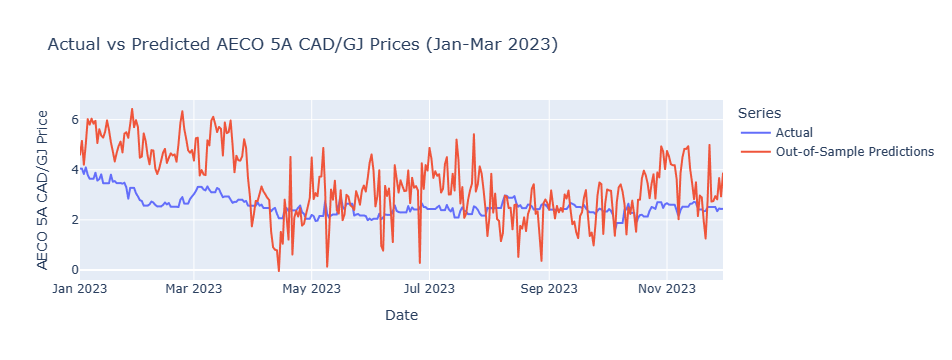

In [64]:
# Using Plotly to plot the actual vs predicted prices
fig = px.line(out_of_sample_results2, x='date', y=['Actual', 'Out-of-Sample Predictions'], 
              title='Actual vs Predicted AECO 5A CAD/GJ Prices (Jan-Mar 2023)', 
              labels={'value': 'AECO 5A CAD/GJ Price', 'variable': 'Series', 'date': 'Date'})

# Customize the appearance
fig.update_layout(xaxis_title='Date',
                  yaxis_title='AECO 5A CAD/GJ Price',
                  legend_title='Series')

# Show the plot
fig.show()

In [65]:
# Group by 'date' and calculate the mean for both 'Actual' and 'Out-of-Sample Predictions'
average_predictions2 = out_of_sample_results2.groupby('date').mean().reset_index()

average_predictions2

,date,Actual,Out-of-Sample Predictions
0,2023-01-01,4.0432,4.598422
1,2023-01-02,4.0432,5.146256
2,2023-01-03,3.8334,4.200861
3,2023-01-04,4.0904,5.028123
4,2023-01-05,3.7974,6.017373
...,...,...,...
329,2023-11-26,2.5153,2.945000
330,2023-11-27,2.3449,2.820096
331,2023-11-28,2.4505,3.665157
332,2023-11-29,2.4360,2.936675


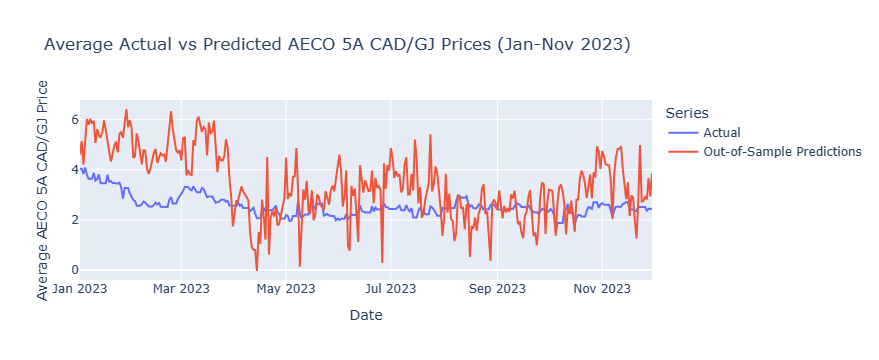

In [66]:
fig = px.line(average_predictions2, x='date', y=['Actual', 'Out-of-Sample Predictions'], 
              title='Average Actual vs Predicted AECO 5A CAD/GJ Prices (Jan-Nov 2023)', 
              labels={'value': 'AECO 5A CAD/GJ Price', 'variable': 'Series', 'date': 'Date'})

# Customize the appearance
fig.update_layout(xaxis_title='Date',
                  yaxis_title='Average AECO 5A CAD/GJ Price',
                  legend_title='Series')

# Show the plot
fig.show()

In [67]:
# Correctly filter the DataFrame for the desired date range
averaged_focused_period2 = average_predictions2[(average_predictions2['date'] >= '2023-06-01') & 
                                                  (average_predictions2['date'] <= '2023-08-30')]
averaged_focused_period2

,date,Actual,Out-of-Sample Predictions
151,2023-06-01,1.991600,4.607378
152,2023-06-02,2.041633,3.970939
153,2023-06-03,2.041633,2.538230
154,2023-06-04,2.041633,2.938563
155,2023-06-05,2.243900,3.979801
...,...,...,...
237,2023-08-26,2.427400,2.339216
238,2023-08-27,2.427400,1.376513
239,2023-08-28,2.599800,0.366064
240,2023-08-29,2.642500,2.652300


### New Testing Model

In [68]:
# Listing all converted natural gas flow variables in GJ
ng_features = [
    'electricity_daily_average',
    'ngtl_storage_receipts_volume_(103m3)_in_GJ',
    'ngtl_gordondale_receipts_volume_(103m3)_in_GJ',
    'ngtl_groundbirch_east_receipts_volume_(103m3)_in_GJ',
    'ngtl_intra_provincial_deliveries_volume_(103m3)_in_GJ',
    'ngtl_empress_deliveries_volume_(103m3)_in_GJ',
    'ngtl_abc_deliveries_volume_(103m3)_in_GJ',
    'ngtl_mcneil_deliveries_volume_(103m3)_in_GJ',
    'ngtl_gordondale_deliveries_volume_(103m3)_in_GJ',
    'ngtl_storage_deliveries_volume_(103m3)_in_GJ',
    'receipts_volume_lag1'
]

# Filter the combined dataset for the relevant columns, including new features
model_df_new = ca_combined_df[ng_features + [target]].dropna()

# Splitting the data based on date
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(ca_combined_df[weather_ng_features].dropna(), ca_combined_df[target].dropna(), test_size=0.2, random_state=42)

# Standardizing the features with the new features included
scaler_new = StandardScaler()
X_train_scaled_new = scaler_new.fit_transform(X_train_new)
X_test_scaled_new = scaler_new.transform(X_test_new)

# Creating polynomial features with interaction terms only (degree=2, interaction_only=True)
poly_interaction = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_train_interaction = poly_interaction.fit_transform(X_train_scaled_new)
X_test_interaction = poly_interaction.transform(X_test_scaled_new)

# Re-initializing and fitting the Linear Regression model with new features
linear_reg_new = LinearRegression()
linear_reg_new.fit(X_train_interaction, y_train_new)

# Predicting on the test set with the new model
y_pred_new = linear_reg_new.predict(X_test_interaction)

# Evaluating the new model
mse_new = mean_squared_error(y_test_new, y_pred_new)
r2_new = r2_score(y_test_new, y_pred_new)

mse_new, r2_new


(0.8170585653349739, 0.6507597950433817)

In [69]:
# Create a DataFrame from y_test for actual values
out_of_sample_results2 = pd.DataFrame(y_test_new)

# Rename the target variable column to 'Actual' for clarity
out_of_sample_results2.rename(columns={'aeco_5a_cad/gj': 'Actual'}, inplace=True)

# Reset index to make 'date' a column again (if needed, depending on your DataFrame setup)
out_of_sample_results2.reset_index(inplace=True)

# Add a column of "out-of-sample" predictions to that dataframe
out_of_sample_results2['Out-of-Sample Predictions'] = y_pred_new

In [70]:
out_of_sample_results2

,date,Actual,Out-of-Sample Predictions
0,2021-08-29,3.5045,3.123765
1,2022-05-21,5.9525,3.805322
2,2021-10-27,6.2111,2.937978
3,2019-12-25,2.1618,2.497305
4,2022-04-15,7.6575,5.294079
...,...,...,...
7771,2019-04-16,1.7973,2.240100
7772,2021-10-03,3.7728,3.786831
7773,2020-07-07,2.0160,1.358988
7774,2018-08-20,0.8157,1.873964


In [71]:
# Group by 'date' and calculate the mean for both 'Actual' and 'Out-of-Sample Predictions'
average_predictions2 = out_of_sample_results2.groupby('date').mean().reset_index()

average_predictions2

,date,Actual,Out-of-Sample Predictions
0,2018-01-01,3.3518,1.293508
1,2018-01-02,2.0754,2.115737
2,2018-01-03,1.8480,1.971946
3,2018-01-04,1.8377,2.347028
4,2018-01-05,1.5431,1.521332
...,...,...,...
2112,2023-11-26,2.5153,2.268825
2113,2023-11-27,2.3449,2.237236
2114,2023-11-28,2.4505,2.796549
2115,2023-11-29,2.4360,2.061001


In [72]:
average_predictions2['date'] = pd.to_datetime(average_predictions2['date'])  # Convert 'date' to datetime if not already
filtered_df = average_predictions2[(average_predictions2['date'] >= '2023-06-01') & (average_predictions2['date'] <= '2023-08-30')]

In [73]:
filtered_df

,date,Actual,Out-of-Sample Predictions
1938,2023-06-01,1.991600,3.913009
1939,2023-06-02,2.041633,4.031747
1940,2023-06-03,2.041633,3.039235
1941,2023-06-04,2.041633,2.657940
1942,2023-06-05,2.243900,4.274855
...,...,...,...
2022,2023-08-26,2.427400,2.428555
2023,2023-08-27,2.427400,2.113483
2024,2023-08-28,2.599800,1.369601
2025,2023-08-29,2.642500,2.672131


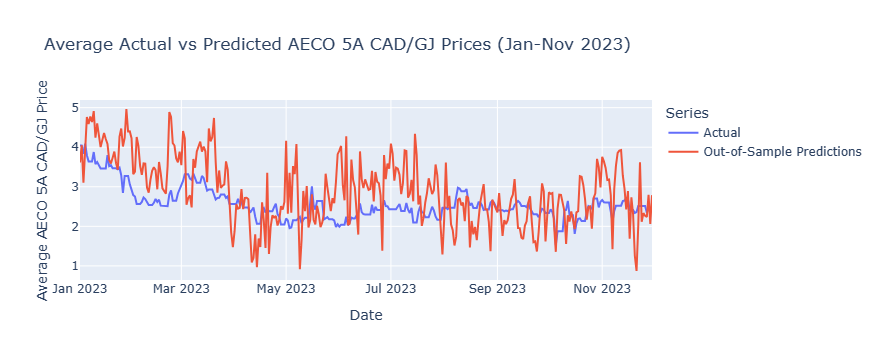

In [74]:
focused_period2 = out_of_sample_results2[(out_of_sample_results2['date'] >= '2023-01-01') & 
                                       (out_of_sample_results2['date'] <= '2023-11-30')]


# Convert index to a column if it's not already, as Plotly works best with column data
focused_period2.reset_index(inplace=True)

# Aggregate data by date, calculating the mean for 'Actual' and 'Out-of-Sample Predictions'
averaged_focused_period2 = focused_period2.groupby('date').mean().reset_index()

fig = px.line(averaged_focused_period2, x='date', y=['Actual', 'Out-of-Sample Predictions'], 
              title='Average Actual vs Predicted AECO 5A CAD/GJ Prices (Jan-Nov 2023)', 
              labels={'value': 'AECO 5A CAD/GJ Price', 'variable': 'Series', 'date': 'Date'})

# Customize the appearance
fig.update_layout(xaxis_title='Date',
                  yaxis_title='Average AECO 5A CAD/GJ Price',
                  legend_title='Series')

# Show the plot
fig.show()

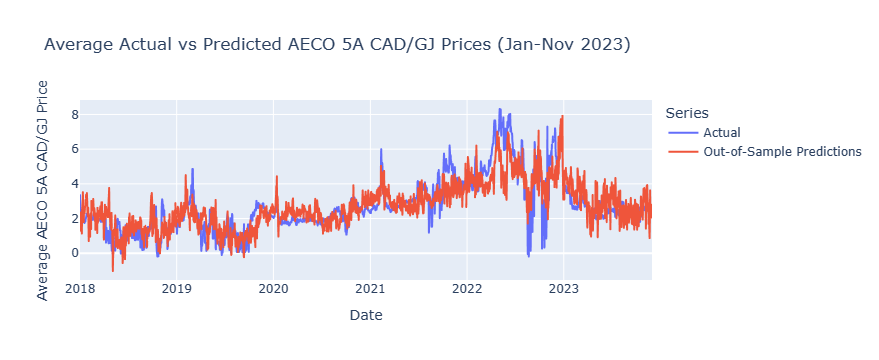

In [75]:
fig = px.line(average_predictions2, x='date', y=['Actual', 'Out-of-Sample Predictions'], 
              title='Average Actual vs Predicted AECO 5A CAD/GJ Prices (Jan-Nov 2023)', 
              labels={'value': 'AECO 5A CAD/GJ Price', 'variable': 'Series', 'date': 'Date'})

# Customize the appearance
fig.update_layout(xaxis_title='Date',
                  yaxis_title='Average AECO 5A CAD/GJ Price',
                  legend_title='Series')

# Show the plot
fig.show()

#### Ridge

In [76]:
# Defining the alphas to test for RidgeCV (Ridge Regression with built-in cross-validation)
alphas = np.logspace(0.00001, 50, 610)

# Initializing and fitting the RidgeCV model
ridge_cv_new = RidgeCV(alphas=alphas, store_cv_values=True)
ridge_cv_new.fit(X_train_interaction, y_train_new)

# Predicting on the test set
y_pred_ridge_new = ridge_cv_new.predict(X_test_interaction)

# Evaluating the Ridge Regression model
mse_ridge_new = mean_squared_error(y_test_new, y_pred_ridge_new)
r2_ridge_new = r2_score(y_test_new, y_pred_ridge_new)

# Optimal alpha value
optimal_alpha_new = ridge_cv_new.alpha_

mse_ridge_new, r2_ridge_new, optimal_alpha_new

(0.8169527735485769, 0.6508050142562161, 9.665659188481245)

#### Lasso

In [77]:
# Initialize LassoCV with built-in cross-validation to find the optimal alpha
lasso_cv_new = LassoCV(cv=5, random_state=42, max_iter=10000, precompute=False)

# Fit LassoCV model on the training data
lasso_cv_new.fit(X_train_interaction, y_train_new)

# Optimal alpha value found by LassoCV
optimal_alpha_lasso_new = lasso_cv_new.alpha_

# Predicting on the test set with the fitted Lasso model
y_pred_lasso_new = lasso_cv_new.predict(X_test_interaction)

# Evaluating the Lasso Regression model
mse_lasso_new = mean_squared_error(y_test_new, y_pred_lasso_new)
r2_lasso_new = r2_score(y_test_new, y_pred_lasso_new)

optimal_alpha_lasso_new, mse_lasso_new, r2_lasso_new

(0.0008100851721582666, 0.8174310780301041, 0.6506005697252517)

In [78]:
# Extracting coefficients for Linear Regression, Ridge, and Lasso models
linear_reg_coeffs_new = linear_reg_new.coef_
ridge_coeffs_new = ridge_cv_new.coef_
lasso_coeffs_new = lasso_cv_new.coef_

# Creating a dataframe to compare the models' performance and coefficients
model_comparison_df_new = pd.DataFrame({
    'Model': ['Linear Regression', 'Ridge Regression', 'Lasso Regression'],
    'MSE': [mse_new, mse_ridge_new, mse_lasso_new],
    'R^2': [r2_new, r2_ridge_new, r2_lasso_new],
    #'Coefficients': [linear_reg_coeffs_new, ridge_coeffs_new, lasso_coeffs_new]
})

model_comparison_df_new

,Model,MSE,R^2
0,Linear Regression,0.817059,0.650760
1,Ridge Regression,0.816953,0.650805
2,Lasso Regression,0.817431,0.650601


## Alberta

### Combine Aberta Data with Daily Data

In [79]:
# Creating cyclical features from day of the year
day_of_year = ab_weather_copy.index.dayofyear
ab_weather_copy['sin_day_of_year'] = np.sin(2 * np.pi * day_of_year / 365)
ab_weather_copy['cos_day_of_year'] = np.cos(2 * np.pi * day_of_year / 365)

In [80]:
# Combine the datasets on their date index
ab_combined_df = ab_weather_copy.join(price_variables_copy, how='left')
ab_combined_df.head()

,township,air_temp._min._(°c),air_temp._max._(°c),precip._(mm),precip._accumulated_(mm),relative_humidity_avg._(%),modelled_snow_water_equiv._(mm),incoming_solar_rad._total_(mj/m2),modelled_incoming_rad._total_(mj/m2),wind_speed_10_m_avg._(km/h),...,ngtl_storage_receipts_volume_(103m3),ngtl_gordondale_receipts_volume_(103m3),ngtl_groundbirch_east_receipts_volume_(103m3),ngtl_intra_provincial_deliveries_volume_(103m3),ngtl_border_deliveries_volume_(103m3),ngtl_empress_deliveries_volume_(103m3),ngtl_abc_deliveries_volume_(103m3),ngtl_mcneil_deliveries_volume_(103m3),ngtl_gordondale_deliveries_volume_(103m3),ngtl_storage_deliveries_volume_(103m3)
date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,T009R21W4,-36.27,-8.35,1.60,277.30,73.47,24.56,6.12,6.67,13.40,...,67055.7,4327.7,12802.6,189057.3,210629.0,96077.1,61914.5,47056.8,0.0,0.0
2018-01-01,T012R06W4,-36.25,-14.30,0.00,274.31,72.40,11.10,4.00,5.80,12.02,...,67055.7,4327.7,12802.6,189057.3,210629.0,96077.1,61914.5,47056.8,0.0,0.0
2018-01-01,T024R01W5,-30.01,-3.27,0.10,299.69,68.84,24.44,5.06,5.89,8.96,...,67055.7,4327.7,12802.6,189057.3,210629.0,96077.1,61914.5,47056.8,0.0,0.0
2018-01-01,T027R29W4,-31.58,-2.98,0.00,313.68,66.18,19.57,5.12,5.97,15.53,...,67055.7,4327.7,12802.6,189057.3,210629.0,96077.1,61914.5,47056.8,0.0,0.0
2018-01-01,T038R27W4,-33.99,-10.56,0.43,351.49,71.17,5.97,4.45,4.97,10.83,...,67055.7,4327.7,12802.6,189057.3,210629.0,96077.1,61914.5,47056.8,0.0,0.0


In [81]:
ab_combined_df.columns

Index(['township', 'air_temp._min._(°c)', 'air_temp._max._(°c)',
       'precip._(mm)', 'precip._accumulated_(mm)',
       'relative_humidity_avg._(%)', 'modelled_snow_water_equiv._(mm)',
       'incoming_solar_rad._total_(mj/m2)',
       'modelled_incoming_rad._total_(mj/m2)', 'wind_speed_10_m_avg._(km/h)',
       'temp_min_1d_lag', 'temp_max_1d_lag', 'temp_min_3d_lag',
       'temp_max_3d_lag', 'temp_min_7d_lag', 'temp_max_7d_lag',
       'sin_day_of_year', 'cos_day_of_year', 'henry_usd/mmbtu',
       'aeco_5a_usd/mmbtu', 'aeco_5a_cad/gj', 'electricity_daily_average',
       'electricity_daily_on_peak_average',
       'electricity_daily_off_peak_average', 'electricity_30ravg_average',
       'electricity_30ravg_on_peak_average',
       'electricity_30ravg__off_peak_average',
       'measured_receipts_volume_(103m3)',
       'ngtl_storage_receipts_volume_(103m3)',
       'ngtl_gordondale_receipts_volume_(103m3)',
       'ngtl_groundbirch_east_receipts_volume_(103m3)',
       'ngtl_int

### LR, Ridge, and Lasso for Predicting AECO Prices Using Weather Variables only

#### Linear Regression

In [82]:
# Selecting the weather variables as features (X) and 'aeco_5a_cad/gj' as the target variable (y)
ab_features = ['air_temp._min._(°c)', 'air_temp._max._(°c)',
            'temp_min_1d_lag', 'temp_max_1d_lag', 'temp_min_3d_lag',
            'temp_max_3d_lag', 'temp_min_7d_lag', 'temp_max_7d_lag',
            'sin_day_of_year', 'cos_day_of_year']

ab_target = 'aeco_5a_cad/gj'

# Filter the combined dataset for the relevant columns
ab_model_df = ab_combined_df[ab_features + [ab_target]].dropna()

# Splitting the data based on date
ab_train_data = ab_model_df.loc['2018':'2022']
ab_test_data = ab_model_df.loc['2023']

ab_X_train = ab_train_data[ab_features]
ab_y_train = ab_train_data[ab_target]
ab_X_test = ab_test_data[ab_features]
ab_y_test = ab_test_data[ab_target]

# Standardizing the features
scaler = StandardScaler()
ab_X_train_scaled = scaler.fit_transform(ab_X_train)
ab_X_test_scaled = scaler.transform(ab_X_test)

# Initializing and fitting the Linear Regression model
ab_linear_reg = LinearRegression()
ab_linear_reg.fit(ab_X_train_scaled, ab_y_train)

# Predicting on the test set
ab_y_pred = ab_linear_reg.predict(ab_X_test_scaled)

# Evaluating the model
ab_mse = mean_squared_error(ab_y_test, ab_y_pred)
ab_r2 = r2_score(ab_y_test, ab_y_pred)

ab_mse, ab_r2

(0.13742637921319215, 0.21611530592476613)

In [83]:
# Create a DataFrame from y_test for actual values
ab_out_of_sample_results = pd.DataFrame(ab_y_test)

# Rename the target variable column to 'Actual' for clarity
ab_out_of_sample_results.rename(columns={'aeco_5a_cad/gj': 'Actual'}, inplace=True)

# Reset index to make 'date' a column again (if needed, depending on your DataFrame setup)
ab_out_of_sample_results.reset_index(inplace=True)

# Add a column of "out-of-sample" predictions to that dataframe
ab_out_of_sample_results['Out-of-Sample Predictions'] = ab_y_pred

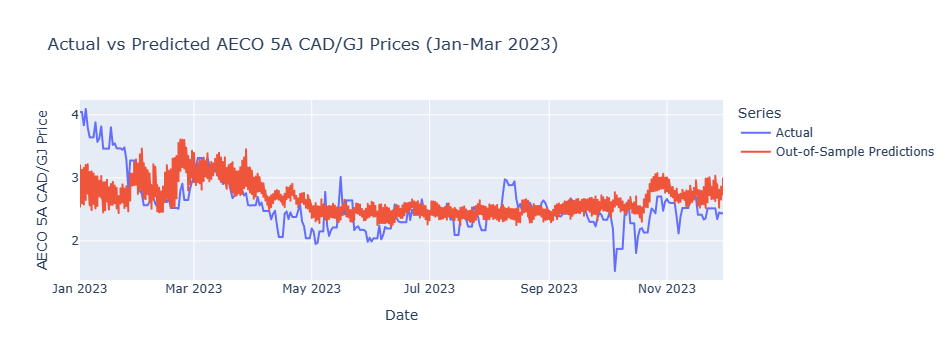

In [84]:
ab_out_of_sample_results['date'] = pd.to_datetime(ab_out_of_sample_results['date'])

ab_focused_period = ab_out_of_sample_results[(ab_out_of_sample_results['date'] >= '2023-01-01') & 
                                       (ab_out_of_sample_results['date'] <= '2023-11-30')]


# Convert index to a column if it's not already, as Plotly works best with column data
ab_focused_period.reset_index(inplace=True)

# Using Plotly to plot the actual vs predicted prices
fig = px.line(ab_focused_period, x='date', y=['Actual', 'Out-of-Sample Predictions'], 
              title='Actual vs Predicted AECO 5A CAD/GJ Prices (Jan-Mar 2023)', 
              labels={'value': 'AECO 5A CAD/GJ Price', 'variable': 'Series', 'date': 'Date'})

# Customize the appearance
fig.update_layout(xaxis_title='Date',
                  yaxis_title='AECO 5A CAD/GJ Price',
                  legend_title='Series')

# Show the plot
fig.show()

#### Ridge

In [85]:
# Defining the alphas to test for ab_RidgeCV (Ridge Regression with built-in cross-validation)
ab_alphas = np.logspace(-6, 6, 13)

# Initializing and fitting the ab_RidgeCV model
ab_ridge_cv = RidgeCV(alphas=ab_alphas, store_cv_values=True)
ab_ridge_cv.fit(ab_X_train_scaled, ab_y_train)

# Predicting on the test set
ab_y_pred_ridge = ab_ridge_cv.predict(ab_X_test_scaled)

# Evaluating the ab_Ridge Regression model
ab_mse_ridge = mean_squared_error(ab_y_test, ab_y_pred_ridge)
ab_r2_ridge = r2_score(ab_y_test, ab_y_pred_ridge)

# Optimal alpha value
ab_optimal_alpha = ab_ridge_cv.alpha_

ab_mse_ridge, ab_r2_ridge, ab_optimal_alpha


(0.13627790738549198, 0.2226662278981536, 100.0)

#### Lasso

In [86]:
# Initialize ab_LassoCV with built-in cross-validation to find the optimal alpha
ab_lasso_cv = LassoCV(cv=5, random_state=42, max_iter=10000, precompute=False)

# Assuming ab_X_train_scaled and ab_y_train are your scaled training features and target variable
# Fit ab_LassoCV model on the training data
ab_lasso_cv.fit(ab_X_train_scaled, ab_y_train)

# Optimal alpha value found by ab_LassoCV
ab_optimal_alpha_lasso = ab_lasso_cv.alpha_

# Predicting on the test set with the fitted Lasso model
ab_y_pred_lasso = ab_lasso_cv.predict(ab_X_test_scaled)

# Assuming ab_y_test is your test target variable
# Evaluating the Lasso Regression model
ab_mse_lasso = mean_squared_error(ab_y_test, ab_y_pred_lasso)
ab_r2_lasso = r2_score(ab_y_test, ab_y_pred_lasso)

ab_optimal_alpha_lasso, ab_mse_lasso, ab_r2_lasso

(0.26355723725825797, 0.20098025422634064, -0.14639813696157034)

In [87]:
# Extracting coefficients for Linear Regression, Ridge, and Lasso models
ab_linear_reg_coeffs = ab_linear_reg.coef_
ab_ridge_coeffs = ab_ridge_cv.coef_
ab_lasso_coeffs = ab_lasso_cv.coef_

# Assuming mse, mse_ridge, mse_lasso, r2, r2_ridge, and r2_lasso are the evaluation metrics for each model
# and have been calculated previously with the "ab_" prefix
# Creating a dataframe to compare the models' performance and coefficients with the "ab_" prefix variables
ab_model_comparison_df = pd.DataFrame({
    'Model': ['Linear Regression', 'Ridge Regression', 'Lasso Regression'],
    'MSE': [ab_mse, ab_mse_ridge, ab_mse_lasso],
    'R^2': [ab_r2, ab_r2_ridge, ab_r2_lasso],
    'Coefficients': [ab_linear_reg_coeffs, ab_ridge_coeffs, ab_lasso_coeffs]
})

ab_model_comparison_df

,Model,MSE,R^2,Coefficients
0,Linear Regression,0.137426,0.216115,"[-0.17360973435372223, -0.07428005752000838, -..."
1,Ridge Regression,0.136278,0.222666,"[-0.16460372579373375, -0.07175619635972998, -..."
2,Lasso Regression,0.200980,-0.146398,"[-5.536584292767568e-17, -0.0, -0.0, -0.0, -0...."


### LR, Ridge, and Lasso for Predicting AECO Prices Using Natural Gas Flow Variables

In [88]:
# Convert the natural gas flow variables from 10^3 m^3 to GJ using the average heating value

# Natural gas flow variables to be converted
ng_flow_variables = [
    'measured_receipts_volume_(103m3)',
    'ngtl_storage_receipts_volume_(103m3)',
    'ngtl_gordondale_receipts_volume_(103m3)',
    'ngtl_groundbirch_east_receipts_volume_(103m3)',
    'ngtl_intra_provincial_deliveries_volume_(103m3)',
    'ngtl_empress_deliveries_volume_(103m3)',
    'ngtl_abc_deliveries_volume_(103m3)',
    'ngtl_mcneil_deliveries_volume_(103m3)',
    'ngtl_gordondale_deliveries_volume_(103m3)',
    'ngtl_storage_deliveries_volume_(103m3)'
]

# Conversion: Volume (10^3 m^3) * 40.05 (MJ/m^3) = Energy content in MJ
# 1 GJ = 1,000 MJ, so divide the result by 1,000 to convert to GJ
for variable in ng_flow_variables:
    new_col_name = f"{variable}_in_GJ"
    ab_combined_df[new_col_name] = ab_combined_df[variable] * 40.05 / 1.0  # Convert directly to GJ without dividing by 1,000 due to the original unit being 10^3 m^3

# Showing the dataframe info to verify the new columns have been added
ab_combined_df.head()

,township,air_temp._min._(°c),air_temp._max._(°c),precip._(mm),precip._accumulated_(mm),relative_humidity_avg._(%),modelled_snow_water_equiv._(mm),incoming_solar_rad._total_(mj/m2),modelled_incoming_rad._total_(mj/m2),wind_speed_10_m_avg._(km/h),...,measured_receipts_volume_(103m3)_in_GJ,ngtl_storage_receipts_volume_(103m3)_in_GJ,ngtl_gordondale_receipts_volume_(103m3)_in_GJ,ngtl_groundbirch_east_receipts_volume_(103m3)_in_GJ,ngtl_intra_provincial_deliveries_volume_(103m3)_in_GJ,ngtl_empress_deliveries_volume_(103m3)_in_GJ,ngtl_abc_deliveries_volume_(103m3)_in_GJ,ngtl_mcneil_deliveries_volume_(103m3)_in_GJ,ngtl_gordondale_deliveries_volume_(103m3)_in_GJ,ngtl_storage_deliveries_volume_(103m3)_in_GJ
date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,T009R21W4,-36.27,-8.35,1.60,277.30,73.47,24.56,6.12,6.67,13.40,...,1.641989e+07,2685580.785,173324.385,512744.13,7571744.865,3847887.855,2479675.725,1884624.84,0.0,0.0
2018-01-01,T012R06W4,-36.25,-14.30,0.00,274.31,72.40,11.10,4.00,5.80,12.02,...,1.641989e+07,2685580.785,173324.385,512744.13,7571744.865,3847887.855,2479675.725,1884624.84,0.0,0.0
2018-01-01,T024R01W5,-30.01,-3.27,0.10,299.69,68.84,24.44,5.06,5.89,8.96,...,1.641989e+07,2685580.785,173324.385,512744.13,7571744.865,3847887.855,2479675.725,1884624.84,0.0,0.0
2018-01-01,T027R29W4,-31.58,-2.98,0.00,313.68,66.18,19.57,5.12,5.97,15.53,...,1.641989e+07,2685580.785,173324.385,512744.13,7571744.865,3847887.855,2479675.725,1884624.84,0.0,0.0
2018-01-01,T038R27W4,-33.99,-10.56,0.43,351.49,71.17,5.97,4.45,4.97,10.83,...,1.641989e+07,2685580.785,173324.385,512744.13,7571744.865,3847887.855,2479675.725,1884624.84,0.0,0.0


#### Linear Regression

In [89]:
# Listing all converted natural gas flow variables in GJ
ab_weather_ng_features = [
    'measured_receipts_volume_(103m3)_in_GJ',
    'ngtl_storage_receipts_volume_(103m3)_in_GJ',
    'ngtl_gordondale_receipts_volume_(103m3)_in_GJ',
    'ngtl_groundbirch_east_receipts_volume_(103m3)_in_GJ',
    'ngtl_intra_provincial_deliveries_volume_(103m3)_in_GJ',
    'ngtl_empress_deliveries_volume_(103m3)_in_GJ',
    'ngtl_abc_deliveries_volume_(103m3)_in_GJ',
    'ngtl_mcneil_deliveries_volume_(103m3)_in_GJ',
    'ngtl_gordondale_deliveries_volume_(103m3)_in_GJ',
    'ngtl_storage_deliveries_volume_(103m3)_in_GJ',
]

# Filter the combined dataset for the relevant columns, including new features
ab_model_df_new = ab_combined_df[ab_weather_ng_features + [ab_target]].dropna()

# Splitting the data based on date with "ab_" prefix variables
ab_train_data_new = ab_model_df_new.loc['2018':'2022']
ab_test_data_new = ab_model_df_new.loc['2023']

ab_X_train_new = ab_train_data_new[ab_weather_ng_features]
ab_y_train_new = ab_train_data_new[ab_target]
ab_X_test_new = ab_test_data_new[ab_weather_ng_features]
ab_y_test_new = ab_test_data_new[ab_target]

# Standardizing the features with the new features included
ab_scaler_new = StandardScaler()
ab_X_train_scaled_new = ab_scaler_new.fit_transform(ab_X_train_new)
ab_X_test_scaled_new = ab_scaler_new.transform(ab_X_test_new)

# Creating polynomial features with interaction terms only (degree=2, interaction_only=True)
ab_poly_interaction = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
ab_X_train_interaction = ab_poly_interaction.fit_transform(ab_X_train_scaled_new)
ab_X_test_interaction = ab_poly_interaction.transform(ab_X_test_scaled_new)

# Re-initializing and fitting the Linear Regression model with new features
ab_linear_reg_new = LinearRegression()
ab_linear_reg_new.fit(ab_X_train_interaction, ab_y_train_new)

# Predicting on the test set with the new model
ab_y_pred_new = ab_linear_reg_new.predict(ab_X_test_interaction)

# Evaluating the new model
ab_mse_new = mean_squared_error(ab_y_test_new, ab_y_pred_new)
ab_r2_new = r2_score(ab_y_test_new, ab_y_pred_new)

ab_mse_new, ab_r2_new


(2.1401249888628606, -11.20734499287809)

In [90]:
# Create a DataFrame from y_test for actual values
ab_out_of_sample_results2 = pd.DataFrame(ab_y_test_new)

# Rename the target variable column to 'Actual' for clarity
ab_out_of_sample_results2.rename(columns={'aeco_5a_cad/gj': 'Actual'}, inplace=True)

# Reset index to make 'date' a column again (if needed, depending on your DataFrame setup)
ab_out_of_sample_results2.reset_index(inplace=True)

# Add a column of "out-of-sample" predictions to that dataframe
ab_out_of_sample_results2['Out-of-Sample Predictions'] = ab_y_pred_new

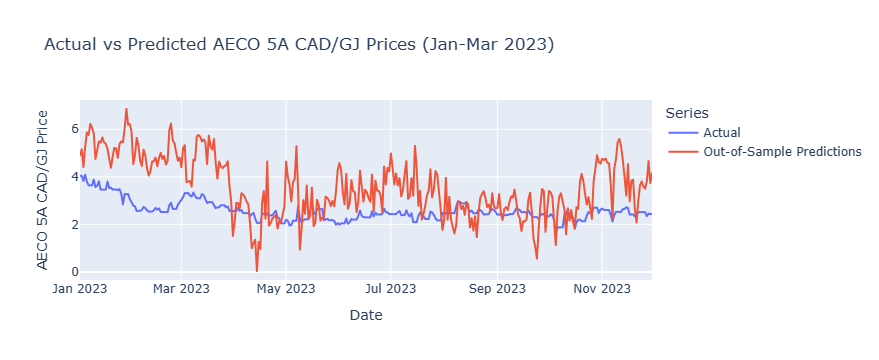

In [91]:
ab_out_of_sample_results2['date'] = pd.to_datetime(ab_out_of_sample_results2['date'])

ab_focused_period2 = ab_out_of_sample_results2[(ab_out_of_sample_results2['date'] >= '2023-01-01') & 
                                       (ab_out_of_sample_results2['date'] <= '2023-11-30')]


# Convert index to a column if it's not already, as Plotly works best with column data
ab_focused_period2.reset_index(inplace=True)

# Using Plotly to plot the actual vs predicted prices
fig = px.line(ab_focused_period2, x='date', y=['Actual', 'Out-of-Sample Predictions'], 
              title='Actual vs Predicted AECO 5A CAD/GJ Prices (Jan-Mar 2023)', 
              labels={'value': 'AECO 5A CAD/GJ Price', 'variable': 'Series', 'date': 'Date'})

# Customize the appearance
fig.update_layout(xaxis_title='Date',
                  yaxis_title='AECO 5A CAD/GJ Price',
                  legend_title='Series')

# Show the plot
fig.show()

#### Ridge

In [92]:
# Defining the alphas to test for RidgeCV (Ridge Regression with built-in cross-validation)
ab_alphas = np.logspace(-6, 6, 13)

# Initializing and fitting the ab_RidgeCV model
ab_ridge_cv_new = RidgeCV(alphas=ab_alphas, store_cv_values=True)
ab_ridge_cv_new.fit(ab_X_train_interaction, ab_y_train_new)

# Predicting on the test set
ab_y_pred_ridge_new = ab_ridge_cv_new.predict(ab_X_test_interaction)

# Evaluating the Ridge Regression model
ab_mse_ridge_new = mean_squared_error(ab_y_test_new, ab_y_pred_ridge_new)
ab_r2_ridge_new = r2_score(ab_y_test_new, ab_y_pred_ridge_new)

# Optimal alpha value
ab_optimal_alpha_new = ab_ridge_cv_new.alpha_

ab_mse_ridge_new, ab_r2_ridge_new, ab_optimal_alpha_new

(2.139844556723907, -11.205745398515559, 1.0)

#### Lasso

In [93]:
# Initialize ab_LassoCV with built-in cross-validation to find the optimal alpha
ab_lasso_cv_new = LassoCV(cv=5, random_state=42, max_iter=10000, precompute=False)

# Fit ab_LassoCV model on the training data
ab_lasso_cv_new.fit(ab_X_train_interaction, ab_y_train_new)

# Optimal alpha value found by ab_LassoCV
ab_optimal_alpha_lasso_new = ab_lasso_cv_new.alpha_

# Predicting on the test set with the fitted Lasso model
ab_y_pred_lasso_new = ab_lasso_cv_new.predict(ab_X_test_interaction)

# Evaluating the Lasso Regression model
ab_mse_lasso_new = mean_squared_error(ab_y_test_new, ab_y_pred_lasso_new)
ab_r2_lasso_new = r2_score(ab_y_test_new, ab_y_pred_lasso_new)

ab_optimal_alpha_lasso_new, ab_mse_lasso_new, ab_r2_lasso_new

(0.0062813031807759665, 2.180693561191797, -11.438749495355763)

In [94]:
# Extracting coefficients for Linear Regression, Ridge, and Lasso models with "ab_" prefix
ab_linear_reg_coeffs_new = ab_linear_reg_new.coef_
ab_ridge_coeffs_new = ab_ridge_cv_new.coef_
ab_lasso_coeffs_new = ab_lasso_cv_new.coef_

# Creating a dataframe to compare the models' performance and coefficients with "ab_" prefix variables
ab_model_comparison_df_new = pd.DataFrame({
    'Model': ['Linear Regression', 'Ridge Regression', 'Lasso Regression'],
    'MSE': [ab_mse_new, ab_mse_ridge_new, ab_mse_lasso_new],
    'R^2': [ab_r2_new, ab_r2_ridge_new, ab_r2_lasso_new],
    'Coefficients': [ab_linear_reg_coeffs_new, ab_ridge_coeffs_new, ab_lasso_coeffs_new]
})

ab_model_comparison_df_new

,Model,MSE,R^2,Coefficients
0,Linear Regression,2.140125,-11.207345,"[1.569080052820428, -0.25859018009772183, -0.1..."
1,Ridge Regression,2.139845,-11.205745,"[1.5663738481304899, -0.25909203790366, -0.172..."
2,Lasso Regression,2.180694,-11.438749,"[1.3461490182309075, -0.41033303008605065, -0...."


### Combining one CA city data with daily variable

In [65]:
# Combine variables data with Calgary weather data
combined_df = pd.merge(price_variables_copy, ca_city, left_index=True, right_index=True, how='inner')

In [66]:
combined_df.head()

,henry_usd/mmbtu,aeco_5a_usd/mmbtu,aeco_5a_cad/gj,electricity_daily_average,electricity_daily_on_peak_average,electricity_daily_off_peak_average,electricity_30ravg_average,electricity_30ravg_on_peak_average,electricity_30ravg__off_peak_average,measured_receipts_volume_(103m3),...,ngtl_mcneil_deliveries_volume_(103m3),ngtl_gordondale_deliveries_volume_(103m3),ngtl_storage_deliveries_volume_(103m3),temperature_2m_max,temperature_2m_min,temperature_2m_mean,precipitation_sum,snowfall_sum,wind_speed_10m_max,city_name
date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,3.580,2.8248,3.3518,37.12,35.50,40.36,22.62,23.69,20.48,409984.7,...,47056.8,0.0,0.0,-3.751,-30.201,-16.969751,0.0,0.0,22.238562,Calgary
2018-01-02,3.580,1.7509,2.0754,33.27,33.89,32.05,22.96,24.03,20.82,417066.6,...,46709.1,0.0,706.8,-0.101,-4.851,-3.138500,0.0,0.0,22.366402,Calgary
2018-01-03,6.625,1.5555,1.8480,34.03,35.20,31.69,23.44,24.53,21.25,397375.6,...,46160.5,0.0,808.0,0.849,-4.201,-1.782250,0.0,0.0,23.363974,Calgary
2018-01-04,6.875,1.5478,1.8377,32.83,34.77,28.93,23.95,25.09,21.67,410188.4,...,43285.0,0.0,474.8,1.299,-5.801,-3.728083,0.0,0.0,15.978484,Calgary
2018-01-05,4.420,1.3134,1.5431,32.65,34.10,29.76,24.38,25.53,22.06,398015.6,...,45130.2,0.0,777.0,3.049,-6.001,-1.103083,0.0,0.0,17.076298,Calgary


In [68]:
# Drop irrelavent columns
combined_df=combined_df.drop(['henry_usd/mmbtu','aeco_5a_usd/mmbtu','city_name'],axis=1)

In [69]:
combined_df.columns

Index(['aeco_5a_cad/gj', 'electricity_daily_average',
       'electricity_daily_on_peak_average',
       'electricity_daily_off_peak_average', 'electricity_30ravg_average',
       'electricity_30ravg_on_peak_average',
       'electricity_30ravg__off_peak_average',
       'measured_receipts_volume_(103m3)',
       'ngtl_storage_receipts_volume_(103m3)',
       'ngtl_gordondale_receipts_volume_(103m3)',
       'ngtl_groundbirch_east_receipts_volume_(103m3)',
       'ngtl_intra_provincial_deliveries_volume_(103m3)',
       'ngtl_border_deliveries_volume_(103m3)',
       'ngtl_empress_deliveries_volume_(103m3)',
       'ngtl_abc_deliveries_volume_(103m3)',
       'ngtl_mcneil_deliveries_volume_(103m3)',
       'ngtl_gordondale_deliveries_volume_(103m3)',
       'ngtl_storage_deliveries_volume_(103m3)', 'temperature_2m_max',
       'temperature_2m_min', 'temperature_2m_mean', 'precipitation_sum',
       'snowfall_sum', 'wind_speed_10m_max'],
      dtype='object')

### LR, Ridge, Lasso with Weather Variables Only

In [70]:
# Create a train/test split for the data using 2018-2022 for training and 2023 for testing
train = combined_df['2018':'2022']
test = combined_df['2023']

C:\Users\zhaoy\AppData\Local\Temp\ipykernel_11540\3448685978.py:3: FutureWarning:

Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.



In [71]:
# Create train and test sets for dependent and independent variables
X_train1 = train[['temperature_2m_max','temperature_2m_min','temperature_2m_mean','precipitation_sum','snowfall_sum','wind_speed_10m_max']]
y_train = train[["aeco_5a_cad/gj"]]
X_test1 = test[['temperature_2m_max','temperature_2m_min','temperature_2m_mean','precipitation_sum','snowfall_sum','wind_speed_10m_max']]
y_test = test[["aeco_5a_cad/gj"]]

#### Linear Regression

In [72]:
# Create and fit model to the data, make predictions
model_lr1 = LinearRegression()
model_lr1.fit(X_train1, y_train)
predictions_lr1 = model_lr1.predict(X_test1)

In [73]:
# Construct a dataframe using just the "y" testing data
out_of_sample_results1 = y_test.copy()

# Rename the 'aeco_5a_cad/gj' column to 'Actual' for clarity
out_of_sample_results1.rename(columns={"aeco_5a_cad/gj": "Actual"}, inplace=True)

# Add a column of "out-of-sample" predictions to that dataframe
out_of_sample_results1["Out-of-Sample Predictions"] = predictions_lr1

array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>],
      dtype=object)

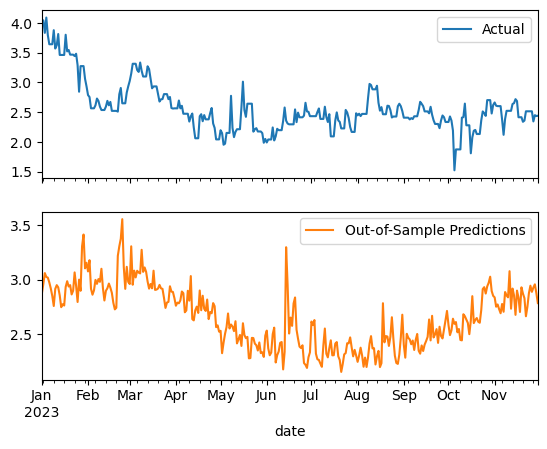

In [74]:
# Plot the out-of-sample results for 2023
out_of_sample_results1.plot(subplots=True)

In [75]:
# Evaluate the model
mse1 = mean_squared_error(y_test, predictions_lr1)
print("Mean Squared Error:", mse1)

# R squared
r_squared1 = model_lr1.score(X_test1, y_test)

print("R-squared for the model:", r_squared1)

Mean Squared Error: 0.14299197069460212
R-squared for the model: 0.1843689847255099


In [76]:
# Extract the coefficients
lr_coefficients1 = model_lr1.coef_
lr_coefficients1

array([[ 0.01231508, -0.00256354, -0.03728072,  0.01411822, -0.04326349,
         0.01825188]], dtype=float32)

#### Ridge

In [77]:
# Scale the features
scaler = StandardScaler()
X_train1_scaled = scaler.fit_transform(X_train1)
X_test1_scaled = scaler.transform(X_test1)

In [78]:
from sklearn.linear_model import RidgeCV

# Define a range of alpha values to test
alphas = np.logspace(-6, 6, 13)

# Create the RidgeCV instance with specified alphas and cross-validation strategy
model_ridge_cv = RidgeCV(alphas=alphas, cv=5) 

# Fit the model to the data
model_ridge_cv.fit(X_train1, y_train)

# Optimal alpha value
optimal_alpha_ridge = model_ridge_cv.alpha_
print("Optimal alpha (Ridge):", model_ridge_cv.alpha_)

Optimal alpha (Ridge): 100000.0


In [79]:
# Create and fit model to the data, make predictions
model_ridge1 = Ridge(alpha=optimal_alpha_ridge)
model_ridge1.fit(X_train1, y_train)
predictions_ridge1 = model_ridge1.predict(X_test1)

In [80]:
# Construct a dataframe using just the "y" testing data
out_of_sample_results2 = y_test.copy()

# Rename the 'aeco_5a_cad/gj' column to 'Actual' for clarity
out_of_sample_results2.rename(columns={"aeco_5a_cad/gj": "Actual"}, inplace=True)

# Add a column of "out-of-sample" predictions to that dataframe
out_of_sample_results2["Out-of-Sample Predictions"] = predictions_ridge1

array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>],
      dtype=object)

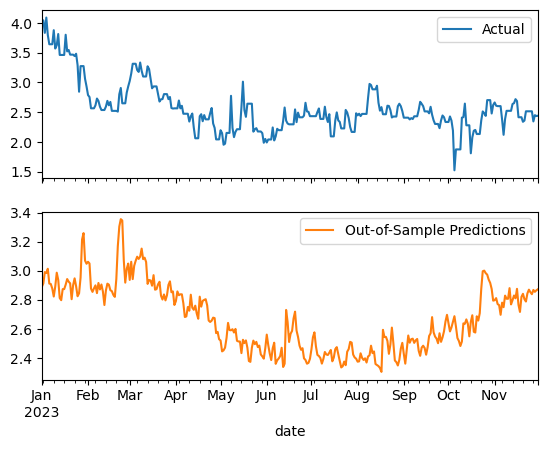

In [81]:
# Plot the out-of-sample results for 2023
out_of_sample_results2.plot(subplots=True)

In [82]:
# Evaluate the model
mse2 = mean_squared_error(y_test, predictions_ridge1)
print("Mean Squared Error:", mse2)

# R squared
r_squared2 = model_ridge1.score(X_test1, y_test)

print("R-squared for the model:", r_squared2)

Mean Squared Error: 0.13258553052895589
R-squared for the model: 0.2437276698073968


In [83]:
# Extract the coefficients
ridge_coefficients1 = model_ridge1.coef_
ridge_coefficients1

array([[-0.00700735, -0.00745356, -0.00746668,  0.00145189, -0.0003033 ,
         0.00660211]], dtype=float32)

#### LASSO

In [84]:
# Scale the features
scaler = StandardScaler()
X_train1_scaled = scaler.fit_transform(X_train1)
X_test1_scaled = scaler.transform(X_test1)

In [85]:
from sklearn.linear_model import LassoCV

# Create the LassoCV instance with specified alphas and cross-validation strategy
model_lasso_cv = LassoCV(cv=5, max_iter=10000, precompute=False)

# Fit the model to the data
model_lasso_cv.fit(X_train1, y_train.values.ravel())

# Optimal alpha value
optimal_alpha = model_lasso_cv.alpha_
print("Optimal alpha (Lasso):", optimal_alpha)

Optimal alpha (Lasso): 0.8503521806025465


In [86]:
# Create and fit the Lasso regression model to the data, make predictions
model_lasso1 = Lasso(alpha=optimal_alpha)
model_lasso1.fit(X_train1, y_train)
predictions_lasso1 = model_lasso1.predict(X_test1)

In [87]:
# Construct a dataframe using just the "y" testing data
out_of_sample_results3 = y_test.copy()

# Rename the 'aeco_5a_cad/gj' column to 'Actual' for clarity
out_of_sample_results3.rename(columns={"aeco_5a_cad/gj": "Actual"}, inplace=True)

# Add a column of "out-of-sample" predictions to that dataframe
out_of_sample_results3["Out-of-Sample Predictions"] = predictions_lasso1


array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>],
      dtype=object)

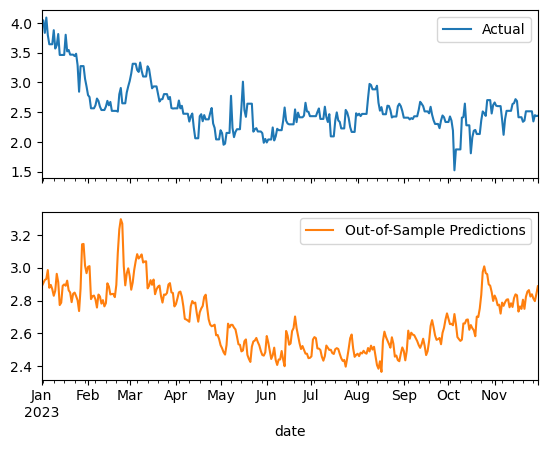

In [88]:
# Plot the out-of-sample results for 2023
out_of_sample_results3.plot(subplots=True)

In [89]:
# Evaluate the model
mse3 = mean_squared_error(y_test, predictions_lasso1)
print("Mean Squared Error:", mse3)

# R squared
r_squared3 = model_lasso1.score(X_test1, y_test)

print("R-squared for the model:", r_squared3)

Mean Squared Error: 0.1368266390235944
R-squared for the model: 0.2195362441590344


In [90]:
# Extract the coefficients
lasso_coefficients1 = model_lasso1.coef_
lasso_coefficients1

array([-0.00237732, -0.        , -0.01551303,  0.        , -0.        ,
        0.        ], dtype=float32)

In [91]:
# Convert coefficients lists to strings for display
lr_coefficients_str = ', '.join(map(str, lr_coefficients1))
ridge_coefficients_str = ', '.join(map(str, ridge_coefficients1))
lasso_coefficients_str = ', '.join(map(str, lasso_coefficients1))

# Create a DataFrame to display the comparison
comparison_df = pd.DataFrame({
    'Model': ['Linear Regression', 'Ridge', 'Lasso'],
    'MSE': [mse1, mse2, mse3],
    'R-Squared': [r_squared1, r_squared2, r_squared3],
    'Coefficients': [lr_coefficients_str, ridge_coefficients_str, lasso_coefficients_str]
})

pd.set_option('display.max_colwidth', None)
comparison_df

,Model,MSE,R-Squared,Coefficients
0,Linear Regression,0.142992,0.184369,[ 0.01231508 -0.00256354 -0.03728072 0.01411822 -0.04326349 0.01825188]
1,Ridge,0.132586,0.243728,[-0.00700735 -0.00745356 -0.00746668 0.00145189 -0.0003033 0.00660211]
2,Lasso,0.136827,0.219536,"-0.0023773185, -0.0, -0.015513029, 0.0, -0.0, 0.0"


### New Pridiction Models

C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



Mean Squared Error: 0.006551929462365587


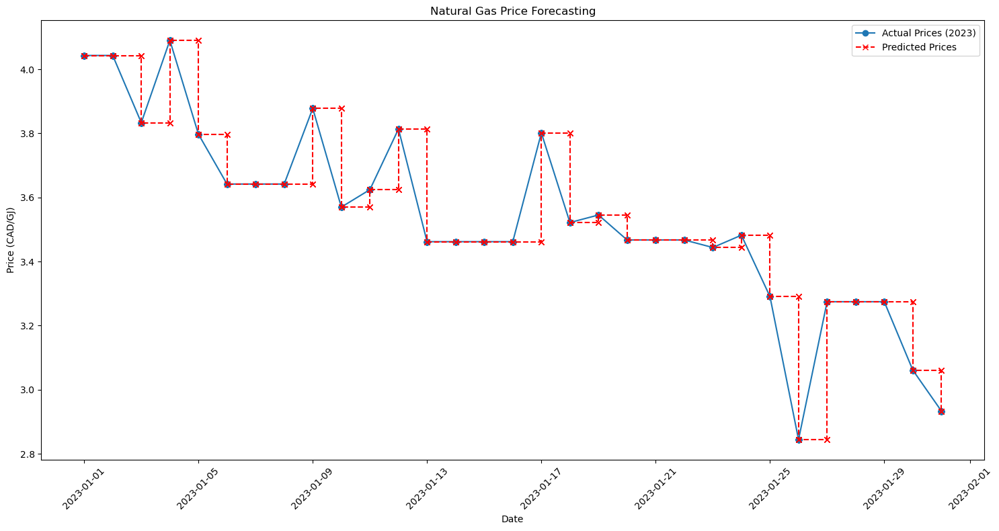

Chosen order (p, d, q): (0, 1, 0)
Chosen seasonal order (P, D, Q, m): (0, 0, 0, 0)


In [131]:
import pmdarima as pm
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Define window size
window_size = 3

# Extract training and testing data
train_data = ca_combined_df['2018-01-01':'2022-12-31']['aeco_5a_cad/gj']
test_data_2023 = ca_combined_df['2023-01-01':'2023-01-31']['aeco_5a_cad/gj']

# Train the SARIMA model on the training data
model = pm.auto_arima(train_data, seasonal=True, stepwise=True, suppress_warnings=True, error_action='ignore')

# Initialize lists for predictions and actual values
predictions = []
actual_values_2023 = []

# Rolling Window Forecasting
for i in range(0, len(test_data_2023), window_size):
    # Define the current window's test data
    if i + window_size < len(test_data_2023):
        current_window_data = test_data_2023.iloc[i:i + window_size]
    else:
        current_window_data = test_data_2023.iloc[i:]
    
    # Forecast for the window size or remaining data points
    forecast = model.predict(n_periods=len(current_window_data))
    
    # Update the model with the current window's data
    model.update(current_window_data)
    
    # Extend the lists with the forecasts and actual values
    predictions.extend(forecast)
    actual_values_2023.extend(current_window_data.values)

# Calculate and print the Mean Squared Error
mse = mean_squared_error(actual_values_2023, predictions)
print(f'Mean Squared Error: {mse}')

# Plotting the results
plt.figure(figsize=(15, 8))
plt.plot(test_data_2023.index, actual_values_2023, label='Actual Prices (2023)', marker='o')
plt.plot(test_data_2023.index, predictions, label='Predicted Prices', color='red', linestyle='--', marker='x')
plt.legend()
plt.title('Natural Gas Price Forecasting')
plt.ylabel('Price (CAD/GJ)')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Print the chosen order and seasonal order of the model
print("Chosen order (p, d, q):", model.order)
print("Chosen seasonal order (P, D, Q, m):", model.seasonal_order)


In [118]:
features

['temperature_2m_max',
 'temperature_2m_min',
 'temperature_2m_mean',
 'snowfall_sum',
 'temp_min_1d_lag',
 'temp_max_1d_lag',
 'temp_min_3d_lag',
 'temp_max_3d_lag',
 'temp_min_7d_lag',
 'temp_max_7d_lag',
 'temp_mean_1d_lag',
 'temp_mean_3d_lag',
 'temp_mean_7d_lag',
 'sin_day_of_year',
 'cos_day_of_year']

In [124]:
! pip install skforecast

   ---------------------------------------- 0.0/424.8 kB ? eta -:--:--
   ------------------- -------------------- 204.8/424.8 kB 4.1 MB/s eta 0:00:01
   ---------------------------------------  419.8/424.8 kB 4.4 MB/s eta 0:00:01
   ---------------------------------------- 424.8/424.8 kB 3.3 MB/s eta 0:00:00
   ---------------------------------------- 0.0/302.2 kB ? eta -:--:--
   ---------------------------------------  297.0/302.2 kB 9.0 MB/s eta 0:00:01
   ---------------------------------------- 302.2/302.2 kB 3.7 MB/s eta 0:00:00
   ---------------------------------------- 0.0/409.6 kB ? eta -:--:--
   ------------------------------- -------- 317.4/409.6 kB 6.5 MB/s eta 0:00:01
   ---------------------------------------  399.4/409.6 kB 6.2 MB/s eta 0:00:01
   ---------------------------------------- 409.6/409.6 kB 3.6 MB/s eta 0:00:00
   ---------------------------------------- 0.0/233.4 kB ? eta -:--:--
   -------------------------------------- - 225.3/233.4 kB 6.9 MB/s eta 0:00

In [125]:
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler

from skforecast.ForecasterAutoreg import ForecasterAutoreg
from skforecast.ForecasterAutoregCustom import ForecasterAutoregCustom
from skforecast.ForecasterAutoregDirect import ForecasterAutoregDirect
from skforecast.model_selection import grid_search_forecaster
from skforecast.model_selection import backtesting_forecaster
from skforecast.utils import save_forecaster
from skforecast.utils import load_forecaster

In [134]:
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from skforecast.model_selection import backtesting_forecaster
from sklearn.linear_model import Ridge
import pandas as pd

y = 'aeco_5a_cad/gj' 
features = ['temperature_2m_max', 'temperature_2m_min'] 

# Split the data into training and testing sets
train_size = len(ca_combined_df) - 250  # Adjust based on your data size
data_train = ca_combined_df.iloc[:-250]
data_test = ca_combined_df.iloc[-250:]

alpha_values = [0.001, 0.01, 0.1, 1.0, 10.0]
optimal_alpha = None
min_mse = float('inf')

# Loop over different alpha values to find the optimal one
for alpha in alpha_values:
    print(f"Current Alpha value: {alpha}")
    
    # Initialize and fit the forecaster
    forecaster = ForecasterAutoreg(
        regressor=Ridge(alpha=alpha),
        lags=8  # Adjust this based on your specific needs
    )
    
    # Note: If using exogenous variables, include them in .fit()
    forecaster.fit(y=data_train[y])
    
    # Perform backtesting to evaluate the model
    metric, predictions = backtesting_forecaster(
        forecaster=forecaster,
        y=ca_combined_df[y],
        initial_train_size=train_size,
        steps=len(data_test),  # Forecast the length of the test set
        metric='mean_squared_error',
        verbose=False
    )
    
    mse = mean_squared_error(data_test[y], predictions)
    print(f"Alpha: {alpha}, MSE: {mse}")
    
    if mse < min_mse:
        min_mse = mse
        optimal_alpha = alpha

print(f"Optimal Alpha: {optimal_alpha}, Minimum MSE: {min_mse}")


Current Alpha value: 0.001


C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\skforecast\utils\utils.py:805: UserWarning:

`y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.

C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\skforecast\utils\utils.py:805: UserWarning:

`y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.

C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\skforecast\utils\utils.py:805: UserWarning:

`y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.

C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\skforecast\utils\utils.py:805: UserWarning:

`y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.



  0%|          | 0/1 [00:00<?, ?it/s]

C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\skforecast\utils\utils.py:867: UserWarning:

`last_window` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.



KeyError: "None of [Int64Index([  8,   9,  10,  11,  12,  13,  14,  15,  16,  17,\n            ...\n            248, 249, 250, 251, 252, 253, 254, 255, 256, 257],\n           dtype='int64', name='date', length=250)] are in the [index]"

In [133]:
ca_combined_df

,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,daylight_duration,sunshine_duration,precipitation_sum,rain_sum,...,ngtl_storage_receipts_volume_(103m3)_in_GJ,ngtl_gordondale_receipts_volume_(103m3)_in_GJ,ngtl_groundbirch_east_receipts_volume_(103m3)_in_GJ,ngtl_intra_provincial_deliveries_volume_(103m3)_in_GJ,ngtl_empress_deliveries_volume_(103m3)_in_GJ,ngtl_abc_deliveries_volume_(103m3)_in_GJ,ngtl_mcneil_deliveries_volume_(103m3)_in_GJ,ngtl_gordondale_deliveries_volume_(103m3)_in_GJ,ngtl_storage_deliveries_volume_(103m3)_in_GJ,receipts_volume_lag1
date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,-14.789001,-26.438999,-21.680666,-19.795292,-31.009094,-26.516375,28789.857422,23494.693359,0.0,0.0,...,2685580.785,173324.385,512744.130,7571744.865,3847887.855,2479675.725,1884624.84,0.0,0.00,NaN
2018-01-01,-3.751000,-30.201000,-16.969751,-10.319794,-36.431252,-22.950150,28830.480469,23759.443359,0.0,0.0,...,2685580.785,173324.385,512744.130,7571744.865,3847887.855,2479675.725,1884624.84,0.0,0.00,1.641989e+07
2018-01-01,-6.139000,-29.539000,-20.355667,-12.209106,-34.811440,-26.140963,27629.332031,21396.341797,0.0,0.0,...,2685580.785,173324.385,512744.130,7571744.865,3847887.855,2479675.725,1884624.84,0.0,0.00,1.641989e+07
2018-01-01,-5.425500,-28.325499,-18.417170,-10.393333,-33.766930,-23.996672,27306.472656,19386.562500,0.0,0.0,...,2685580.785,173324.385,512744.130,7571744.865,3847887.855,2479675.725,1884624.84,0.0,0.00,1.641989e+07
2018-01-01,-7.713000,-23.913000,-17.394251,-13.038786,-30.080166,-23.063616,24959.728516,17042.283203,0.1,0.0,...,2685580.785,173324.385,512744.130,7571744.865,3847887.855,2479675.725,1884624.84,0.0,0.00,1.641989e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-30,2.959000,-7.241000,-0.388917,-1.491806,-10.950583,-4.795246,31873.240234,0.000000,0.4,0.0,...,1416588.525,125973.270,124799.805,8218680.525,5070938.760,3294661.185,748085.94,0.0,6680.34,1.794846e+07
2023-11-30,-2.244500,-10.794500,-6.954918,-6.340574,-15.122340,-11.459414,29160.646484,24049.205078,0.0,0.0,...,1416588.525,125973.270,124799.805,8218680.525,5070938.760,3294661.185,748085.94,0.0,6680.34,1.794846e+07
2023-11-30,7.786000,-2.164000,3.242250,3.053649,-7.375102,-1.697321,33125.281250,28620.212891,0.0,0.0,...,1416588.525,125973.270,124799.805,8218680.525,5070938.760,3294661.185,748085.94,0.0,6680.34,1.794846e+07


### ARMA Model for Weather Prediction

In [116]:
combined_df.head()

,aeco_5a_cad/gj,electricity_daily_average,electricity_daily_on_peak_average,electricity_daily_off_peak_average,electricity_30ravg_average,electricity_30ravg_on_peak_average,electricity_30ravg__off_peak_average,measured_receipts_volume_(103m3),ngtl_storage_receipts_volume_(103m3),ngtl_gordondale_receipts_volume_(103m3),...,ngtl_abc_deliveries_volume_(103m3),ngtl_mcneil_deliveries_volume_(103m3),ngtl_gordondale_deliveries_volume_(103m3),ngtl_storage_deliveries_volume_(103m3),temperature_2m_max,temperature_2m_min,temperature_2m_mean,precipitation_sum,snowfall_sum,wind_speed_10m_max
date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,3.3518,37.12,35.50,40.36,22.62,23.69,20.48,409984.7,67055.7,4327.7,...,61914.5,47056.8,0.0,0.0,-3.751,-30.201,-16.969751,0.0,0.0,22.238562
2018-01-02,2.0754,33.27,33.89,32.05,22.96,24.03,20.82,417066.6,53334.3,5141.3,...,63916.3,46709.1,0.0,706.8,-0.101,-4.851,-3.138500,0.0,0.0,22.366402
2018-01-03,1.8480,34.03,35.20,31.69,23.44,24.53,21.25,397375.6,28213.0,4423.3,...,64814.9,46160.5,0.0,808.0,0.849,-4.201,-1.782250,0.0,0.0,23.363974
2018-01-04,1.8377,32.83,34.77,28.93,23.95,25.09,21.67,410188.4,38279.6,4600.9,...,65416.2,43285.0,0.0,474.8,1.299,-5.801,-3.728083,0.0,0.0,15.978484
2018-01-05,1.5431,32.65,34.10,29.76,24.38,25.53,22.06,398015.6,22488.2,4986.4,...,62671.0,45130.2,0.0,777.0,3.049,-6.001,-1.103083,0.0,0.0,17.076298


In [117]:
temp_df = combined_df[['temperature_2m_mean']]
temp_df.tail()

,temperature_2m_mean
date,
2023-11-26,-1.780167
2023-11-27,-0.090583
2023-11-28,0.757333
2023-11-29,-1.486417
2023-11-30,-4.055167


In [118]:
temp_df_old = temp_df[temp_df.index <= '2022-12-31']

In [119]:
from statsmodels.tsa.stattools import adfuller

In [120]:
def dickey_fuller(series):
    result = adfuller(series)
    print('ADF Statistic: %f' % result[0])
    print('p-value:        %f ' % result[1])
    print('Lags used:      %d' % result[2])
    print('Critical Values:')
    for key, value in result[4].items():
        print('%s: %.3f' % (key, value))
    if result[1]<0.05:
        print('\The p-value is below the significance level of 0.05. \n\nWe can reject the hypothesis that the time series is non-stationary.')
    else: 
        print('\The p-value is above the significance level of 0.05. \n\nWe cannot reject the hypothesis that the time series is non-stationary.')
 

In [121]:
dickey_fuller(temp_df_old)

ADF Statistic: -3.680868
p-value:        0.004390 
Lags used:      10
Critical Values:
1%: -3.434
5%: -2.863
10%: -2.568
\The p-value is below the significance level of 0.05. 

We can reject the hypothesis that the time series is non-stationary.


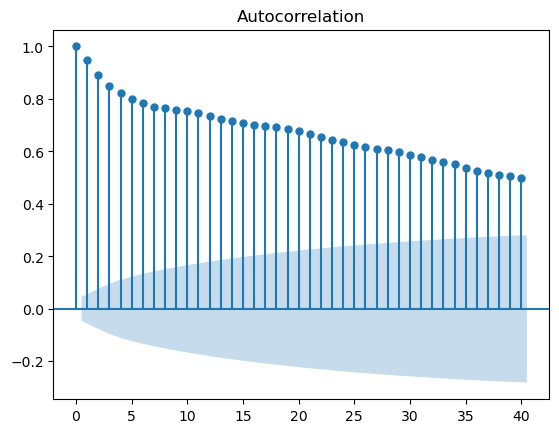

In [122]:
# Plot the autocorrelation
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(temp_df_old, lags=40)
plt.show()

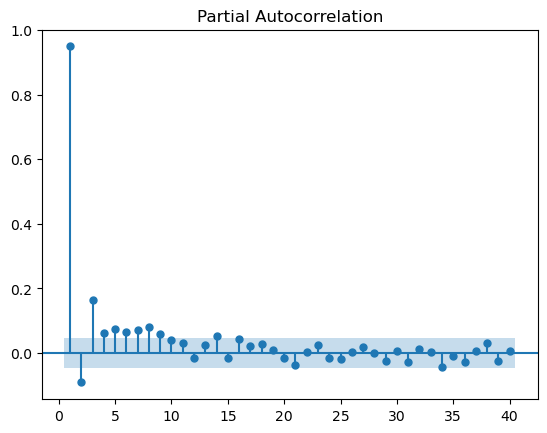

In [123]:
# Plot the partial autocorrelation
plot_pacf(temp_df_old, zero=False, lags=40)
plt.show()

In [124]:
from statsmodels.tsa.arima_model import ARMA

In [125]:
model_arma = ARMA(temp_df_old.temperature_2m_mean, order=(3, 3))
result = model_arma.fit()
result.summary()

C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning:


statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)


C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\zhaoy\anacond

<class 'statsmodels.iolib.summary.Summary'>
"""
                               ARMA Model Results                              
===============================================================================
Dep. Variable:     temperature_2m_mean   No. Observations:                 1826
Model:                      ARMA(3, 3)   Log Likelihood               -4815.575
Method:                        css-mle   S.D. of innovations              3.379
Date:                 Tue, 27 Feb 2024   AIC                           9647.151
Time:                         14:11:37   BIC                           9691.230
Sample:                     01-01-2018   HQIC                          9663.410
                          - 12-31-2022                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                         3.3304      2.221      1.499      0.134      -1.023       7.684
ar.L1.temperature_2m_mean     2.6137        nan        nan        nan         nan         nan
ar.L2.temperature_2m_mean    -2.2395      0.006   -390.594      0.000      -2.251      -2.228
ar.L3.temperature_2m_mean     0.6256      0.003    226.649      0.000       0.620       0.631
ma.L1.temperature_2m_mean    -1.5927      0.022    -73.453      0.000      -1.635      -1.550
ma.L2.temperature_2m_mean     0.3370      0.043      7.849      0.000       0.253       0.421
ma.L3.temperature_2m_mean     0.2612      0.022     11.931      0.000       0.218       0.304
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0163           -0.0176j            1.0165           -0.0027
AR.2            1.0163           +0.0176j            1.0165            0.0027
AR.3            1.5470           -0.0000j            1.5470           -0.0000
MA.1            1.0591           -0.0367j            1.0598           -0.0055
MA.2            1.0591           +0.0367j            1.0598            0.0055
MA.3           -3.4086           -0.0000j            3.4086           -0.5000
-----------------------------------------------------------------------------
"""

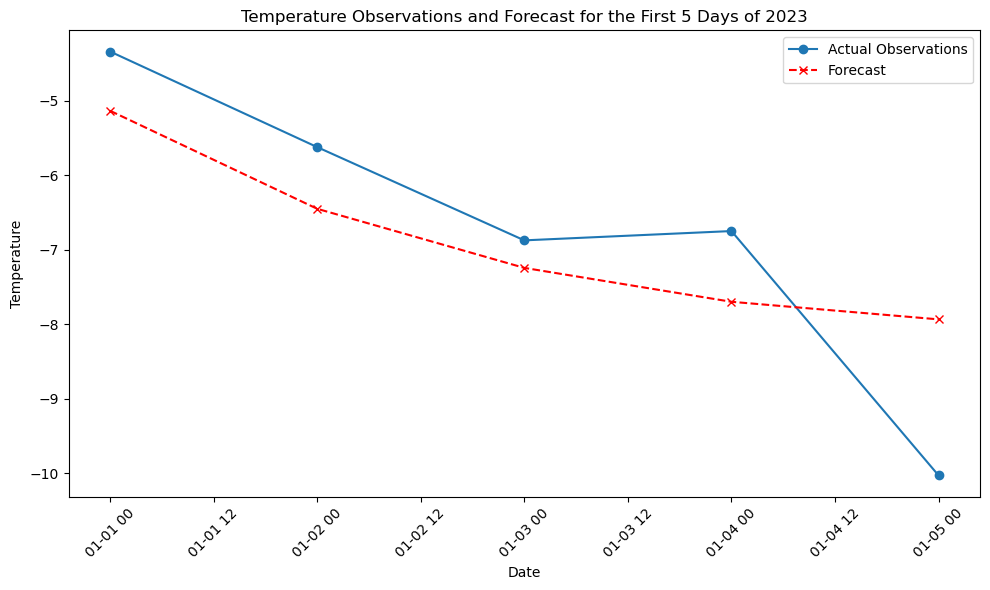

In [126]:
forecast_values = result.forecast(steps=5)[0]
forecast_dates = pd.date_range(start='2023-01-01', periods=5)

# Convert forecast values to a DataFrame for easier plotting
forecast_df = pd.DataFrame(forecast_values, index=forecast_dates, columns=['Forecast'])

# Filter the DataFrame to include only the first 5 days of 2023
first_5_days_2023 = temp_df['2023-01-01':'2023-01-05']

# Plotting
plt.figure(figsize=(10, 6)) 

# Plot actual observations
plt.plot(first_5_days_2023.index, first_5_days_2023['temperature_2m_mean'], marker='o', label='Actual Observations')

# Plot forecasted values
plt.plot(forecast_df.index, forecast_df['Forecast'], marker='x', linestyle='--', color='red', label='Forecast')

plt.title('Temperature Observations and Forecast for the First 5 Days of 2023')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout() 
plt.show()


In [127]:
# Count the number of observations in the remaining dataset
observations_count = temp_df['2023-01-01':'2023-11-30'].shape[0]
observations_count

334

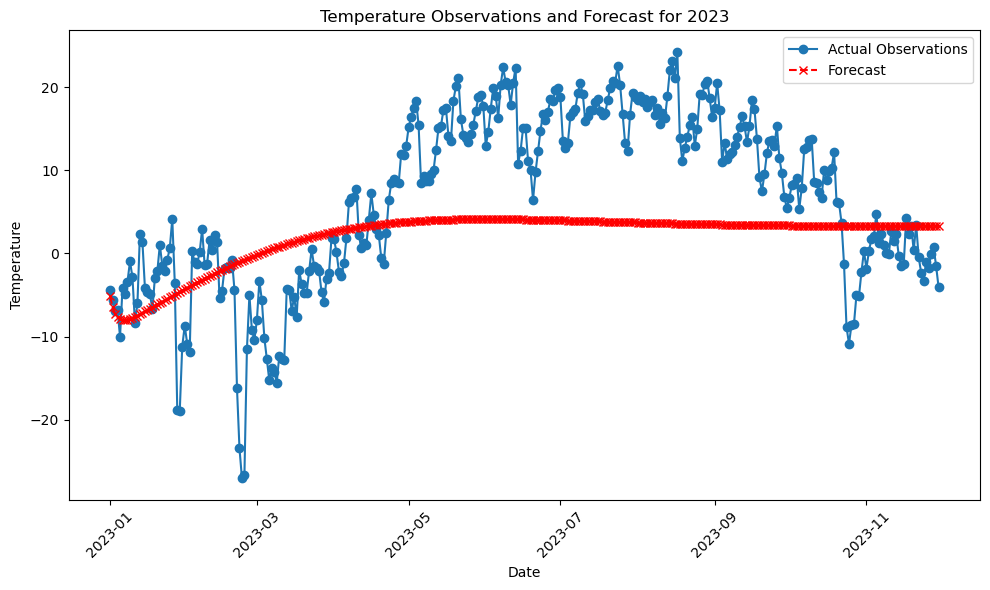

In [128]:
forecast_values = result.forecast(steps=observations_count)[0]
forecast_dates = pd.date_range(start='2023-01-01', periods=observations_count)

# Convert forecast values to a DataFrame for easier plotting
forecast_df = pd.DataFrame(forecast_values, index=forecast_dates, columns=['Forecast'])

# Filter the DataFrame to include only the first 5 days of 2023
all_2023_days = temp_df['2023-01-01':'2023-11-30']

# Plotting
plt.figure(figsize=(10, 6)) 

# Plot actual observations
plt.plot(all_2023_days.index, all_2023_days['temperature_2m_mean'], marker='o', label='Actual Observations')

# Plot forecasted values
plt.plot(forecast_df.index, forecast_df['Forecast'], marker='x', linestyle='--', color='red', label='Forecast')

plt.title('Temperature Observations and Forecast for 2023')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout() 
plt.show()

In [129]:
import itertools
p = q = range(0, 4)
pq = itertools.product(p, q)
for param in pq:
    try:
        mod = ARMA(temp_df_old.temperature_2m_mean,order=param)
        results = mod.fit()
        print('ARMA{} - AIC:{}'.format(param, results.aic))
    except:
        continue

C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning:


statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)


C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\zhaoy\anacond

ARMA(0, 0) - AIC:13995.794084638663
ARMA(0, 1) - AIC:12112.905102918321
ARMA(0, 2) - AIC:11140.467590462133
ARMA(0, 3) - AIC:10667.158802068636
ARMA(1, 0) - AIC:9774.875576023229
ARMA(1, 1) - AIC:9748.574648883452


C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



ARMA(1, 2) - AIC:9710.52104199259


C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



ARMA(1, 3) - AIC:9684.36075259509
ARMA(2, 0) - AIC:9757.508620820008


C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



ARMA(2, 1) - AIC:9735.074310345963


C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



ARMA(2, 2) - AIC:9652.031686334947


C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



ARMA(2, 3) - AIC:9654.023017541029
ARMA(3, 0) - AIC:9707.852204963092


C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



ARMA(3, 1) - AIC:9657.62221305556


C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



ARMA(3, 2) - AIC:9654.022025048216


C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



ARMA(3, 3) - AIC:9647.150682488791


C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\base\model.py:547: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\zhaoy\anaconda3\envs\tf2\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



### ARIMA for Price Prediction

In [295]:
ca_combined_df.columns

Index(['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean',
       'apparent_temperature_max', 'apparent_temperature_min',
       'apparent_temperature_mean', 'daylight_duration', 'sunshine_duration',
       'precipitation_sum', 'rain_sum', 'snowfall_sum', 'precipitation_hours',
       'wind_speed_10m_max', 'wind_gust_10m_max',
       'wind_direction_10m_dominant', 'shortwave_radiation_sum',
       'et0_fao_evapotransporation', 'city_name', 'temp_min_1d_lag',
       'temp_max_1d_lag', 'temp_min_3d_lag', 'temp_max_3d_lag',
       'temp_min_7d_lag', 'temp_max_7d_lag', 'temp_min_14d_lag',
       'temp_max_14d_lag', 'temp_min_30d_lag', 'temp_max_30d_lag',
       'temp_min_365d_lag', 'temp_max_365d_lag', 'sin_day_of_year',
       'cos_day_of_year', 'temp_mean_1d_lag', 'temp_mean_3d_lag',
       'temp_mean_7d_lag', 'henry_usd/mmbtu', 'aeco_5a_usd/mmbtu',
       'aeco_5a_cad/gj', 'electricity_daily_average',
       'electricity_daily_on_peak_average',
       'electricity_daily_o

In [303]:
# Define the range of p, d, and q values to try
ps = range(0, 3)
ds = range(0, 3)
qs = range(0, 3)

# Define a list to store the results
results = []

# Select specific columns from the exogenous DataFrame
exog_vars = ['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean','measured_receipts_volume_(103m3)',
             'ngtl_storage_receipts_volume_(103m3)']
#exog_df_subset = df[exog_vars]


######All variables
#The model chosen is the one with the lowest mean square error (MSE)

# Loop through all possible combinations of p, d, and q values
for p in ps:
    for d in ds:
        for q in qs:
            try:
                # Fit the ARIMA model with exogenous variables on the training set
                arima_model = ARIMA(train_data['aeco_5a_cad/gj'], order=(p, d, q), exog=train_data[exog_vars])
                arima_results = arima_model.fit()
                print(arima_results.summary())

                # Use the model to make predictions on the test set
                exog_test = test_data[exog_vars].fillna(method='ffill') # Handle missing values
                predictions = arima_results.predict(start=test_data.index[0], end=test_data.index[-1], exog=exog_test)

                # Calculate the mean squared error (MSE) of the predictions
                mse = ((predictions - test_data['aeco_5a_cad/gj']) ** 2).mean()

                # Save the results
                results.append({
                    'p': p,
                    'd': d,
                    'q': q,
                    'MSE': mse
                })
            except:
                pass

# Convert the results to a DataFrame
results_df = pd.DataFrame(results)

# Print the results sorted by MSE
#print(results_df.sort_values('MSE'))

In [304]:
results_df

""


In [ ]:
# Transform into a stationary process
price_variables_copy['aeco_return'] = price_variables_copy['aeco_5a_cad/gj'].pct_change()
price_variables_copy.head()

In [ ]:
price_variables_copy2 = price_variables_copy.dropna()
# Select only the returns
aeco_returns = price_variables_copy2.loc[:, 'aeco_return']

In [ ]:
aeco_returns.plot()

In [ ]:
# Import the ARMA model
from statsmodels.tsa.arima_model import ARMA

In [ ]:
# Create the ARMA model using the return values and the order
# For the order parameter, the first 1 indicates the number of AR lags
# For the order parameter, the second 1 indicates the number of MA lags
model1 = ARMA(aeco_returns.values, order=(1,1))
# Fit the model to the data
results1 = model1.fit()
type(results1)

In [ ]:
#The result of the forecast() function is an array containing the forecast value, the standard error of the forecast, and the confidence interval information. 
print(f'forecast {results1.forecast()}')
print(f'Standard Error {results1.forecast()[1]}')
print(f'Confidence Interval {results1.forecast()[2]}')

In [ ]:
# Plot the forecasted return for the next 10 days
pd.DataFrame(results1.forecast(steps=10)[0]).plot(title="Aeco Return Forecast")

In [ ]:
# Plot the autocorrelation of the aeco data
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(aeco_returns, lags=40)

In [ ]:
# Plot the partial autocorrelation of the aeco data
plot_pacf(aeco_returns, zero=False, lags=40)

### US Weather Data Using NCEI API

In [2]:
import requests
import json

# List of station IDs
stations = [
    "USW00023050","USW00026451","USW00013874","USW00093784","USW00024033",
    "USW00024131","USW00014739","USW00094702","USW00014742","USW00013880",
    "USW00013866","USW00013881","USW00024018","USW00014819","USW00014821",
    "USW00014765","USW00013764","USW00023062","USW00014933","USW00014822",
    "USW00014914","USW00012918","USW00003856","USW00093819","USW00003940",
    "USW00013889","USW00003947","USW00023169","USW00003952","USW00023174",
    "USW00093821","USW00014710","USW00014839","USW00014922","USW00013897",
    "USW00012916","USW00094728","USW00014734","USW00013737","USW00013967",
    "USW00014942","USW00013739","USW00023183","USW00024229","USW00014764",
    "USW00024127","USW00024234","USW00014944","USW00013743","USW00003928",
    
]

# Join the station IDs into a string
stations_string = ','.join(stations)

# Example URL for NOAA's Climate Data Online (CDO) or other relevant endpoint
url = f"https://www.ncei.noaa.gov/access/services/data/v1?dataset=daily-summaries&stations={stations_string}&startDate=2018-01-01&endDate=2023-12-31&units=metric&format=json&includeStationName=true"


# Make the request
response = requests.get(url)

# Check if the request was successful
if response.status_code == 200:
    # Parse the JSON response
    data = response.json()

print(f"Number of entries: {len(data)}")
if data:  # Check if data is not empty
    first_date = data[0]['DATE']
    last_date = data[-1]['DATE']
    print(f"Date range: {first_date} to {last_date}")


Number of entries: 104337
Date range: 2018-01-01 to 2023-12-31


In [3]:
# Convert the data to a DataFrame
us_weather_df = pd.DataFrame(data)

# Display the first few rows of the DataFrame
us_weather_df.tail()


,WSF2,STATION,WSF5,SNOW,RHMX,ASLP,PRCP,RHAV,SNWD,NAME,...,SN52,PSUN,TSUN,TOBS,WT11,MDSF,DASF,WDFG,WSFG,WESD
104332,10.7,USW00003928,13.4,0.0,NaN,NaN,0.0,NaN,0.0,"WICHITA DWIGHT D. EISENHOWER NATIONAL AIRPORT,...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
104333,9.4,USW00003928,12.5,0.0,NaN,NaN,0.0,NaN,0.0,"WICHITA DWIGHT D. EISENHOWER NATIONAL AIRPORT,...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
104334,9.4,USW00003928,12.5,0.0,NaN,NaN,0.0,NaN,0.0,"WICHITA DWIGHT D. EISENHOWER NATIONAL AIRPORT,...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
104335,4.5,USW00003928,6.3,0.0,NaN,NaN,0.0,NaN,0.0,"WICHITA DWIGHT D. EISENHOWER NATIONAL AIRPORT,...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
104336,9.4,USW00003928,12.1,0.0,89,1024.0,0.0,80,0.0,"WICHITA DWIGHT D. EISENHOWER NATIONAL AIRPORT,...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
us_weather_df.columns

Index(['WSF2', 'STATION', 'WSF5', 'SNOW', 'RHMX', 'ASLP', 'PRCP', 'RHAV',
       'SNWD', 'NAME', 'ASTP', 'DATE', 'RHMN', 'WDF2', 'AWND', 'WDF5', 'AWBT',
       'TMAX', 'ADPT', 'TAVG', 'TMIN', 'WT08', 'WT01', 'PGTM', 'WT02', 'WT03',
       'WT05', 'WT09', 'WT07', 'WT06', 'WT04', 'WT10', 'SX32', 'SN32', 'SX52',
       'SN52', 'PSUN', 'TSUN', 'TOBS', 'WT11', 'MDSF', 'DASF', 'WDFG', 'WSFG',
       'WESD'],
      dtype='object')

In [5]:
us_weather_df['NAME'].unique()

array(['ALBUQUERQUE INTERNATIONAL AIRPORT, NM US',
       'ANCHORAGE TED STEVENS INTERNATIONAL AIRPORT, AK US',
       'ATLANTA HARTSFIELD JACKSON INTERNATIONAL AIRPORT, GA US',
       'MARYLAND SCIENCE CENTER, MD US',
       'BILLINGS INTERNATIONAL AIRPORT, MT US',
       'BOISE AIR TERMINAL, ID US',
       'BOSTON LOGAN INTERNATIONAL AIRPORT, MA US',
       'IGOR I SIKORSKY MEMORIAL AIRPORT, CT US',
       'BURLINGTON INTERNATIONAL AIRPORT, VT US',
       'CHARLESTON INTL. AIRPORT, SC US',
       'CHARLESTON WEST VIRGINIA INTERNATIONAL YEAGER AIRPORT, WV US',
       'CHARLOTTE DOUGLAS AIRPORT, NC US',
       'CHICAGO MIDWAY AIRPORT, IL US',
       'JOHN GLENN INTERNATIONAL AIRPORT, OH US',
       'GEORGETOWN DELAWARE COASTAL AIRPORT, DE US',
       'DENVER CENTRAL PARK, CO US',
       'DES MOINES INTERNATIONAL AIRPORT, IA US',
       'DETROIT CITY AIRPORT, MI US',
       'FARGO HECTOR INTERNATIONAL AIRPORT, ND US',
       'HOUSTON WILLIAM P HOBBY AIRPORT, TX US',
       'HUNTSVILLE I

In [12]:
us_weather_copy.index.unique()

NameError: name 'us_weather_copy' is not defined

In [ ]:
# Filter the DataFrame to keep observations before Nov 30, 2023
us_weather_copy = us_weather_copy[us_weather_copy.index <= '2023-11-30']

### Cleaning US weather data

In [6]:
#Checking data types
us_weather_df.dtypes

WSF2       object
STATION    object
WSF5       object
SNOW       object
RHMX       object
ASLP       object
PRCP       object
RHAV       object
SNWD       object
NAME       object
ASTP       object
DATE       object
RHMN       object
WDF2       object
AWND       object
WDF5       object
AWBT       object
TMAX       object
ADPT       object
TAVG       object
TMIN       object
WT08       object
WT01       object
PGTM       object
WT02       object
WT03       object
WT05       object
WT09       object
WT07       object
WT06       object
WT04       object
WT10       object
SX32       object
SN32       object
SX52       object
SN52       object
PSUN       object
TSUN       object
TOBS       object
WT11       object
MDSF       object
DASF       object
WDFG       object
WSFG       object
WESD       object
dtype: object

In [7]:
# Count the number of missing values (NaNs) in each column
missing_values_count = us_weather_df.isna().sum()

# Identify columns with more than 20,000 missing values
columns_to_drop = missing_values_count[missing_values_count > 20000].index

# Drop these columns from the DataFrame
us_weather_df.drop(columns=columns_to_drop, inplace=True)

In [8]:
# Setting data column as index
us_weather_df = us_weather_df.set_index('DATE')

In [9]:
# Dropping additional columns
additional_columns = ['WSF2', 'WSF5','RHMX','ASLP','RHAV','ASTP','RHMN','WDF2','WDF5','ADPT']
us_weather_df.drop(columns=additional_columns, inplace=True)

In [10]:
us_weather_df.dtypes

STATION    object
SNOW       object
PRCP       object
SNWD       object
NAME       object
AWND       object
AWBT       object
TMAX       object
TMIN       object
dtype: object

In [11]:
# Converting object columns to numeric types
columns_to_convert = ['SNOW', 'PRCP', 'SNWD', 'AWND', 'AWBT', 'TMAX', 'TMIN'] 

for column in columns_to_convert:
    us_weather_df[column] = pd.to_numeric(us_weather_df[column], errors='coerce')

# Checking types again
us_weather_df.dtypes

STATION     object
SNOW       float64
PRCP       float64
SNWD       float64
NAME        object
AWND       float64
AWBT       float64
TMAX       float64
TMIN       float64
dtype: object

In [12]:
us_weather_df.head()

,STATION,SNOW,PRCP,SNWD,NAME,AWND,AWBT,TMAX,TMIN
DATE,,,,,,,,,
2018-01-01,USW00023050,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",2.8,-4.4,8.9,-7.1
2018-01-02,USW00023050,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",2.1,-2.2,12.8,-4.3
2018-01-03,USW00023050,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",2.1,-3.3,10.0,-3.8
2018-01-04,USW00023050,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",1.1,-2.8,11.1,-0.5
2018-01-05,USW00023050,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",1.1,-2.8,12.8,-3.8


In [13]:
#making a copy
us_weather_copy = us_weather_df.copy()

In [14]:
us_weather_copy.isna().sum()

STATION        0
SNOW       16676
PRCP          50
SNWD       19380
NAME           0
AWND        4462
AWBT       15280
TMAX          37
TMIN          39
dtype: int64

In [15]:
# Handling missing values using interpolation
us_weather_copy['SNWD'].interpolate(method='linear', inplace=True)
us_weather_copy['PRCP'].interpolate(method='linear', inplace=True)
us_weather_copy['AWND'].interpolate(method='linear', inplace=True)
us_weather_copy['AWBT'].interpolate(method='linear', inplace=True)
us_weather_copy['TMAX'].interpolate(method='linear', inplace=True)
us_weather_copy['TMIN'].interpolate(method='linear', inplace=True)
us_weather_copy['SNOW'].interpolate(method='linear', inplace=True)

In [16]:
us_weather_copy.isna().sum()

STATION    0
SNOW       0
PRCP       0
SNWD       0
NAME       0
AWND       0
AWBT       0
TMAX       0
TMIN       0
dtype: int64

In [17]:
us_weather_copy.head()

,STATION,SNOW,PRCP,SNWD,NAME,AWND,AWBT,TMAX,TMIN
DATE,,,,,,,,,
2018-01-01,USW00023050,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",2.8,-4.4,8.9,-7.1
2018-01-02,USW00023050,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",2.1,-2.2,12.8,-4.3
2018-01-03,USW00023050,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",2.1,-3.3,10.0,-3.8
2018-01-04,USW00023050,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",1.1,-2.8,11.1,-0.5
2018-01-05,USW00023050,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",1.1,-2.8,12.8,-3.8


In [18]:
us_weather_copy.columns = us_weather_copy.columns.str.lower()

In [19]:
us_weather_copy.index.name = us_weather_copy.index.name.lower()

In [20]:
us_weather_copy.head()

,station,snow,prcp,snwd,name,awnd,awbt,tmax,tmin
date,,,,,,,,,
2018-01-01,USW00023050,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",2.8,-4.4,8.9,-7.1
2018-01-02,USW00023050,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",2.1,-2.2,12.8,-4.3
2018-01-03,USW00023050,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",2.1,-3.3,10.0,-3.8
2018-01-04,USW00023050,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",1.1,-2.8,11.1,-0.5
2018-01-05,USW00023050,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",1.1,-2.8,12.8,-3.8


In [21]:
# Dropping station column
us_weather_copy.drop(columns="station", inplace=True)

In [22]:
us_weather_copy['name'].unique()

array(['ALBUQUERQUE INTERNATIONAL AIRPORT, NM US',
       'ANCHORAGE TED STEVENS INTERNATIONAL AIRPORT, AK US',
       'ATLANTA HARTSFIELD JACKSON INTERNATIONAL AIRPORT, GA US',
       'MARYLAND SCIENCE CENTER, MD US',
       'BILLINGS INTERNATIONAL AIRPORT, MT US',
       'BOISE AIR TERMINAL, ID US',
       'BOSTON LOGAN INTERNATIONAL AIRPORT, MA US',
       'IGOR I SIKORSKY MEMORIAL AIRPORT, CT US',
       'BURLINGTON INTERNATIONAL AIRPORT, VT US',
       'CHARLESTON INTL. AIRPORT, SC US',
       'CHARLESTON WEST VIRGINIA INTERNATIONAL YEAGER AIRPORT, WV US',
       'CHARLOTTE DOUGLAS AIRPORT, NC US',
       'CHICAGO MIDWAY AIRPORT, IL US',
       'JOHN GLENN INTERNATIONAL AIRPORT, OH US',
       'GEORGETOWN DELAWARE COASTAL AIRPORT, DE US',
       'DENVER CENTRAL PARK, CO US',
       'DES MOINES INTERNATIONAL AIRPORT, IA US',
       'DETROIT CITY AIRPORT, MI US',
       'FARGO HECTOR INTERNATIONAL AIRPORT, ND US',
       'HOUSTON WILLIAM P HOBBY AIRPORT, TX US',
       'HUNTSVILLE I

In [23]:
# Keep only the first word (the city name) in each entry of the "name" column
us_weather_copy['city'] = us_weather_copy['name'].str.split().str[0]

In [24]:
us_weather_copy.head()

,snow,prcp,snwd,name,awnd,awbt,tmax,tmin,city
date,,,,,,,,,
2018-01-01,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",2.8,-4.4,8.9,-7.1,ALBUQUERQUE
2018-01-02,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",2.1,-2.2,12.8,-4.3,ALBUQUERQUE
2018-01-03,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",2.1,-3.3,10.0,-3.8,ALBUQUERQUE
2018-01-04,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",1.1,-2.8,11.1,-0.5,ALBUQUERQUE
2018-01-05,0.0,0.0,0.0,"ALBUQUERQUE INTERNATIONAL AIRPORT, NM US",1.1,-2.8,12.8,-3.8,ALBUQUERQUE


In [25]:
len(us_weather_copy)

104337

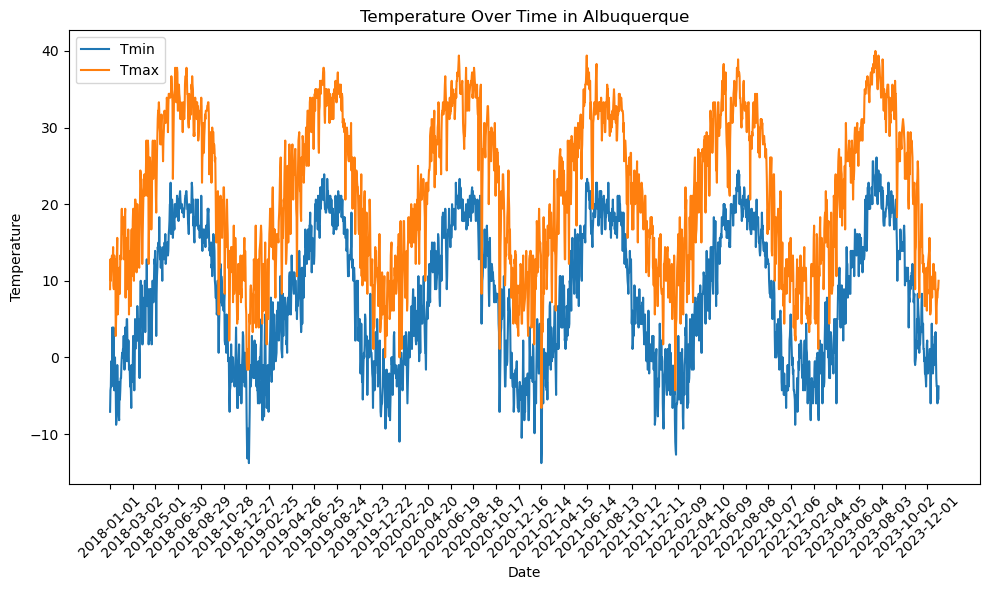

In [26]:
# plot
df_city = us_weather_copy[us_weather_copy['city'] == 'ALBUQUERQUE']

# Ensure the index is in datetime format for plotting
df_city.index = pd.to_datetime(df_city.index)

# Initialize the figure and its size before plotting
plt.figure(figsize=(10, 6))

# Now plot tmin and tmax
plt.plot(df_city.index, df_city['tmin'], label='Tmin')
plt.plot(df_city.index, df_city['tmax'], label='Tmax')

# Set the title, labels, and legend
plt.title('Temperature Over Time in Albuquerque')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.legend()

# Since you're modifying the ticks, do this after the figure has been established
# Also, make sure to set the xticks before calling plt.show()
selected_ticks = df_city.index[::60]  # Every 60 days; adjust as needed
plt.xticks(selected_ticks, rotation=45)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


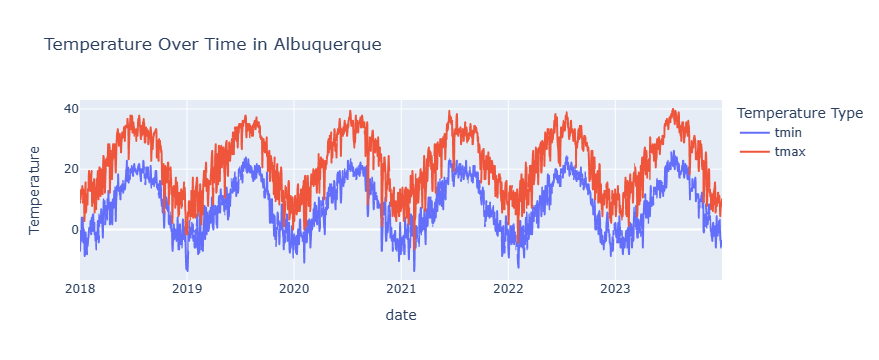

In [27]:
import plotly.express as px

fig = px.line(df_city, x=df_city.index, y=['tmin', 'tmax'], title='Temperature Over Time in Albuquerque', labels={'value': 'Temperature', 'variable': 'Temperature Type'})
fig.show()


In [28]:
# Create lagged temperature columns for 1-day, 3-day lags, and 7-day lags as "forecast"
us_weather_copy['temp_min_1d_lag'] = us_weather_copy['tmin'].shift(1)
us_weather_copy['temp_max_1d_lag'] = us_weather_copy['tmax'].shift(1)

us_weather_copy['temp_min_3d_lag'] = us_weather_copy['tmin'].shift(3)
us_weather_copy['temp_max_3d_lag'] = us_weather_copy['tmax'].shift(3)

us_weather_copy['temp_min_7d_lag'] = us_weather_copy['tmin'].shift(7)
us_weather_copy['temp_max_7d_lag'] = us_weather_copy['tmax'].shift(7)

#### Testing Code

In [51]:
# Define the target variable
target = 'aeco_5a_cad/gj'

# Selecting features: Excluding non-numeric and target variable itself
features = ca_combined_df.select_dtypes(include=[np.number]).columns.drop(target)

# Dropping rows with missing values in the target or features
data_clean = ca_combined_df.dropna(subset=[target] + features.tolist())

# Define X (features) and y (target)
X = data_clean[features]
y = data_clean[target]

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Model evaluation
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

mse, r2


(0.005008124026296013, 0.9979859794388254)

In [52]:
len(y_pred)

7775

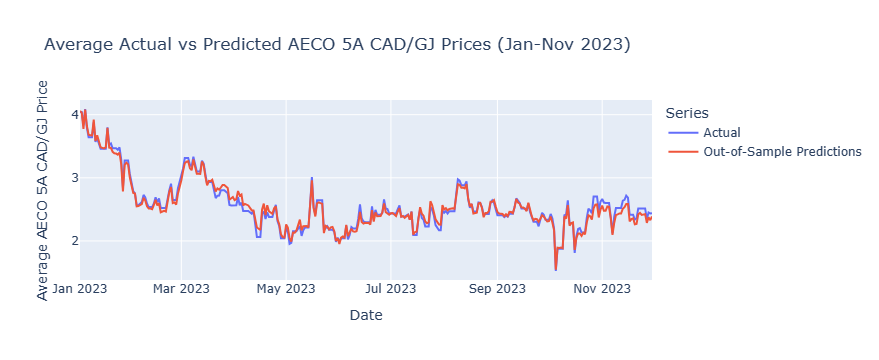

In [53]:
# Create a DataFrame from y_test for actual values
out_of_sample_results = pd.DataFrame(y_test)

# Rename the target variable column to 'Actual' for clarity
out_of_sample_results.rename(columns={'aeco_5a_cad/gj': 'Actual'}, inplace=True)

# Reset index to make 'date' a column again (if needed, depending on your DataFrame setup)
out_of_sample_results.reset_index(inplace=True)

# Add a column of "out-of-sample" predictions to that dataframe
out_of_sample_results['Out-of-Sample Predictions'] = y_pred

focused_period = out_of_sample_results[(out_of_sample_results['date'] >= '2023-01-01') & 
                                       (out_of_sample_results['date'] <= '2023-11-30')]


# Convert index to a column if it's not already, as Plotly works best with column data
focused_period.reset_index(inplace=True)

# Aggregate data by date, calculating the mean for 'Actual' and 'Out-of-Sample Predictions'
averaged_focused_period = focused_period.groupby('date').mean().reset_index()

fig = px.line(averaged_focused_period, x='date', y=['Actual', 'Out-of-Sample Predictions'], 
              title='Average Actual vs Predicted AECO 5A CAD/GJ Prices (Jan-Nov 2023)', 
              labels={'value': 'AECO 5A CAD/GJ Price', 'variable': 'Series', 'date': 'Date'})

# Customize the appearance
fig.update_layout(xaxis_title='Date',
                  yaxis_title='Average AECO 5A CAD/GJ Price',
                  legend_title='Series')

# Show the plot
fig.show()